In [8]:
#packages

using Pkg
#Pkg.add("LinearAlgebra")
#Pkg.add("LinearSolve")
#Pkg.add("Plots")
#Pkg.add("Printf")
#Pkg.add("LaTeXStrings")
#Pkg.add("Interpolations")
#Pkg.add("NPZ")


using LinearAlgebra
using LinearSolve
using Plots
using LaTeXStrings
using Interpolations
using NPZ
using Printf

using LsqFit


#-------------------------------------------------------------------------------------
#	dressing of function f (given as array f_discr, occupation ratio given as n_discr)
#-------------------------------------------------------------------------------------

function dress(gb, lam_discr, n_discr, f_discr)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])
    A = I - 0.5/pi * varphimat*Diagonal(n_discr)*Diagonal(dlam)
    A\f_discr
end

#-------------------------------------------------------------------------------------
#	to evaluate charge density associated with function f
#-------------------------------------------------------------------------------------

function charge_density(gb, lam_discr, n_discr, f_discr)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])
    A = I - 0.5/pi * varphimat*Diagonal(n_discr)*Diagonal(dlam)
    0.5/pi * dot(dlam , Diagonal(n_discr) * (A \ f_discr) )
end

#-------------------------------------------------------------------------
#	solve Yang-Yang equation
#-------------------------------------------------------------------------

function fun1(z)
    if z>0
        return log(1. +exp(-z))
    else
        return log(1. +exp(z)) - z
    end
end

function fun2(z)
    if z<0
        return 1. /(1. +exp(z))
    else
        return exp(-z)/(1. +exp(-z))
    end
end

function yangyang(gb, beta, lam_discr)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])

    bare_E = 0.5 * beta[3] * lam_discr.^2 + beta[2] * lam_discr + beta[1] * ones(L)
    eps = copy(bare_E)
    n = fun2.(eps)

    #iterative solution
    diff = 1.
    while diff>1e-12
        old_n = copy(n)
        eps = bare_E - 0.5/pi * varphimat*Diagonal( fun1.(eps) )*dlam
        n = fun2.(eps)
        diff = norm(n-old_n)
    end
    return n
end

#-------------------------------------------------------------------------------------
#	compute effective velocity
#-------------------------------------------------------------------------------------

function veff(gb, lam_discr, n_discr)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])
    dresser = I - 0.5/pi * varphimat*Diagonal(n_discr)*Diagonal(dlam)
    onedr = dresser\ones(L)
    iddr = dresser\copy(lam_discr)
    iddr ./ onedr
end

#-------------------------------------------------------------------------------------
#	time evolution for box expansion
#-------------------------------------------------------------------------------------

function evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
    npts_integral = 600
    L = size(x1)[1]
    
    veff1 = zeros(L)
    veff2 = zeros(L)
    #println(@sprintf "size x2 = %.3f , size theta_tab  = %.3f " size(x1)[1] size(theta_tab)[1])
    #display(x2)
    #display(theta_tab)
    f2 = linear_interpolation(x2, theta_tab)
    f1 = linear_interpolation(x1, theta_tab)
    #velocity of first and last points is the one of free particles
    veff1[1] = theta_tab[1]
    veff2[L] = theta_tab[L]

    for j in 2:L
        thet1 = theta_tab[j]
        if x1[j]<x2[1]
            thet2 = theta_tab[1]
        else
            thet2 = f2(x1[j])
        end
        lam_discr = LinRange(thet2,thet1,npts_integral)
        n_discr = n_fun.(lam_discr)
        veff1[j] = last(veff(gb, lam_discr, n_discr))
        #velocities of right contour (using parity symmetry)
        #veff2[L+1-j] = -veff1[j]
    end
    # sans symetrie
    for j in 1:L-1
        thet1 = theta_tab[j]
        if x2[j] > x1[L]
            thet2 = theta_tab[L]
        else 
            thet2 = f1(x2[j])
        end 
        lam_discr = LinRange(thet1, thet2, 600)
        n_discr = n_fun.(lam_discr)
        veff2[j] = veff(gb, lam_discr, n_discr)[1]
    end
    
    return x1 + dt*veff1, x2 + dt*veff2
end

#-------------------------------------------------------------------------------------
#	box expansion: calculate density (careful: return density in units of rapidities
#    for density in mu^-1 multiply by mass/hbar)
#-------------------------------------------------------------------------------------

function eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
    L = size(x1)[1]
    
    dens = zeros(2,2*L)
    f2 = linear_interpolation(x2, theta_tab)
    f1 = linear_interpolation(x1, theta_tab)
    #density of first and last points is zero
    dens[1,1] = x1[1]
    dens[2,1] = 0
    dens[1,L+1] = x2[L]
    dens[2,L+1] = 0
    #println( @sprintf "n_p = %.3f" ratio_m_hbar * charge_density(gb, theta_tab, n_fun.(theta_tab), ones(size(theta_tab)[1]) ))
    for j in 2:L
        thet1 = theta_tab[j]
        if x1[j]<x2[1]
            thet2 = theta_tab[1]
        else
            #println("nnn")
            thet2 = f2(x1[j])
        end
        lam_discr = LinRange(thet2,thet1,600)
        n_discr = n_fun.(lam_discr)
        dens[1,j] = x1[j]
        dens[2,j] = ratio_m_hbar * charge_density(gb, lam_discr, n_discr, ones(size(lam_discr)[1]) )
        #if j == L 
        #    println( @sprintf " j = %.3f , theta 1 = %.3f , theta 2 = %.3f , n_p1 = %.3f" j thet2 thet1 dens[2,j])
        #end 
        #velocities of right contour (using parity symmetry)
        #dens[1,L+j] = x2[L+1-j]      
        #dens[2,L+j] = dens[2,j]
    end
    #without symmetry 
    for j in 1:L-1
        thet1 = theta_tab[j]
        if x2[j]>x1[L]
            thet2 = theta_tab[L]
        else 
            #println("nnn")
            thet2 = f1(x2[j])
        end 
        lam_discr = LinRange(thet1,thet2,600)
        n_discr = n_fun.(lam_discr)
        dens[1,2*L+1-j] = x2[j] 
        dens[2,2*L+1-j] = ratio_m_hbar * charge_density(gb, lam_discr, n_discr, ones(size(lam_discr)[1]) ) 
        #if j == 1 
        #    println( @sprintf " j = %.3f , theta 1 = %.3f , theta 2 = %.3f , n_p1 = %.3f" j thet1 thet2 dens[2,2*L+1-j])
        #end 
    end
    #sort densities according to positions, and return
    dens[:,sortperm(dens[1, :])]
end

#------------------------------------------------------------------------------------------------
#	function for simulating box expansion. Writes results in file 'data/density_expansion_t.npd'
#     where 't' is the time (takes a list of times to be saved as argument)
#------------------------------------------------------------------------------------------------

function box_expansion(n_fun, dt, list_t_save, theta_max, npts, gb, ratio_m_hbar)
    tmax = maximum(list_t_save)
    theta_tab = LinRange(-theta_max, theta_max, npts)
    x1 = -0.5 * ones(npts) + 0.0000001*theta_tab
    x2 = 0.5 * ones(npts) + 0.0000001*theta_tab
        
    t = 0
    while t<=tmax
        x1, x2 = evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
        t += dt
        
        for ts in list_t_save
            if t-dt<ts && ts<=t
                mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
                println(@sprintf "t = %.3f saved" t)
                #filename = @sprintf "%s/density_expansion_n_theta_etoile_conv_py_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mu) Float64(T) Float64(Taille) Float64(t)
                #filename = @sprintf "%s/density_expansion_n_py_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mu) Float64(T) Float64(Taille) Float64(t)
                filename = @sprintf "%s/density_expansion_n_theta_etoile_py_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mup/kB) Float64(T) Float64(Taille) Float64(t)
                #filename = @sprintf "%s/density_expansion_n_tout_py_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mup/kB) Float64(T) Float64(Taille) Float64(t)
                npzwrite(filename, mydensity)
            end
        end
    end
end



[ Info: Precompiling LinearSolveRecursiveArrayToolsExt [04950c4b-5bc4-5740-952d-02d2c1eb583a]
[ Info: Precompiling DistributionsChainRulesCoreExt [6db1f127-056a-568b-bd49-ae61d42389fa]


box_expansion (generic function with 1 method)

In [9]:
function DeltaMat(theta_discr , gbar )
    L = size(theta_discr)[1]
    varphi(theta) = 2*gbar/( gbar^2 + theta^2 )
    varphimat = zeros(L,L)
    

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( theta_discr[i]-theta_discr[j] )
            varphimat[j,i] = varphi( theta_discr[i]-theta_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)
    return varphimat
end 

function Delta(theta_discr)
    L = size(theta_discr)[1]
    dtheta = zeros(L)
        
    for i = 2:L-1
        dtheta[i] = 0.5*(theta_discr[i+1]-theta_discr[i-1])
    end
    dtheta[1] = 0.5*(theta_discr[2]-theta_discr[1])
    dtheta[L] = 0.5*(theta_discr[L]-theta_discr[L-1])
    
    return dtheta
end 

function montrer_les_rho(theta_discr, nu_discr)
    L = length(theta_discr)
    
    varphimat = DeltaMat(theta_discr , gbar)
    dtheta = Delta(theta_discr)
    
    # Plot nu_tilde
    p = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="f", legend=:topright)
    plot!(p , theta_discr , nu_discr, label="\$\\tilde{\\nu}\$")
    # Méthode 0
    rho_s_0 = 0.5 / pi * dress(gbar , theta_discr, nu_discr, ones(L))
    rho_0 = nu_discr .* rho_s_0
    
    # Méthode 1
    Mat_F_1 = I - (1 / (2 * pi)) * Diagonal(dtheta) * Diagonal(nu_discr) * varphimat
    B = (1 / (2 * pi)) * nu_discr
    rho_1 = Mat_F_1 \ B
    rho_s_1 = rho_1 ./ nu_discr

    # Méthode 2
    Mat_F_2 = I - 0.5 / pi * varphimat * Diagonal(nu_discr) * Diagonal(dtheta)
    B = (1 / (2 * pi)) * ones(L)
    rho_s_2 = Mat_F_2 \ B
    rho_2 = nu_discr .* rho_s_2
    
    # Plot résultats de la méthode 0
    plot!(p, theta_discr, rho_s_0, label="Meth 0 : \$\\tilde{\\rho_s}= \\frac{1}{2\\pi}\\\$")
    plot!(p, theta_discr, rho_0, label="Meth 0 : \$\\tilde{\\rho} = \\tilde{\\nu} * \\tilde{\\rho_s}\$")
    
    # Plot résultats de la méthode 1
    plot!(p, theta_discr, rho_1, label="Meth 1 : \$\\tilde{\\rho}= \\frac{\\tilde{\\nu}}{2\\pi} ( 1 + \\tilde{\\Delta} * \\tilde{\\rho}) \$")
    plot!(p, theta_discr, rho_s_1, label="Meth 1 : \$\\tilde{\\rho}_s  = \\frac{\\tilde{\\rho}}{\\tilde{\\nu}}  \$")
    
    # Plot résultats de la méthode 2
    plot!(p, theta_discr, rho_s_2, label="Meth 2 : \$\\tilde{\\rho_s}= \\frac{1}{2\\pi}\$")
    plot!(p, theta_discr, rho_2, label="Meth 2 : \$\\tilde{\\rho} = \\tilde{\\nu} * \\tilde{\\rho_s}\$")

    display(p)
    
    #p1 = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="\$\\Delta\$", legend=:topright)

    # Plot des différences entre les résultats des deux méthodes
    #plot(p1,theta_discr, rho_s_1 - rho_s_2, label="\$ \\Delta \\tilde{\\rho_s}\$")
    #plot(p1,theta_discr, rho_1 - rho_2, label="\$\\Delta \\tilde{\\rho}\$")

    # Légendes et labels
    #display(p1)
end

#-------------------------------------------------------------------------------------
#	theta start
#-------------------------------------------------------------------------------------

using Roots
function find_nu_theta_star_discr( theta_discr , theta_star  , nu_discr )
    return ifelse.(theta_discr .> theta_star, 0, nu_discr)
end 

function find_theta_star(theta_discr, nu_discr ,  gbar)
    
    # Définition de la fonction f_veff_star_theta_star
    f_veff_star_theta_star = theta_star -> linear_interpolation(theta_discr, veff( gbar, theta_discr, find_nu_theta_star_discr(theta_discr, theta_star, nu_discr)))(theta_star)
    
    return fzero(f_veff_star_theta_star, theta_discr[1] , last(theta_discr))
end

find_theta_star (generic function with 1 method)

In [10]:
import Pkg
#Pkg.add("Dates")
using Dates

# Formater la date selon le format spécifié
new_date = Dates.format(Dates.today(), "yyyy-mm-dd")

# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)

2024-02-27


In [11]:
#new_date = "test"
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)

2024-02-27


In [12]:
using Plots
using Printf
using Interpolations

# Définir les constantes
hbar = 1.05457182e-25   # um^2.kg/ms
mass =  1.44e-25        # kg (mass of Rubidium 87)
kB = 1.380649e-26       # um^2.ms^-2.kg.nK^{-1}
a3D = 5.3e-3            # um
om_perp = 2 * pi * 2.56  # kHz (transverse frequency)

# Calculer les constantes dérivées
g = 2 * hbar * a3D * om_perp        # effective 1d repulsion strength
c = mass / hbar^2 * g              # um^{-1}
gbar = g / hbar                   # um.ms^{-1}

println(g*45/kB)

58.60451714829708


# Bord ( 2em coupure homogène)

42.567567567567565
saved : 2024-02-27/theta_discr_h.npz
  0.014589 seconds (4.64 k allocations: 8.307 MiB)
size : 200
saved : 2024-02-27/nu_discr_h_46.599_200.000.npz


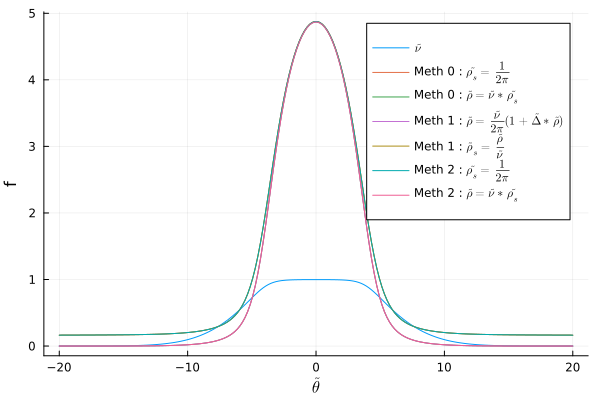

  0.001624 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-27/rho_s_discr_h_46.599_200.000.npz
  0.000019 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-27/rho_discr_h_46.599_200.000.npz
  0.691540 seconds (15.38 M allocations: 374.007 MiB, 23.07% gc time)
saved : 2024-02-27/theta_star_1.0_h_46.599_200.000.npz
  0.000007 seconds (110 allocations: 5.250 KiB)


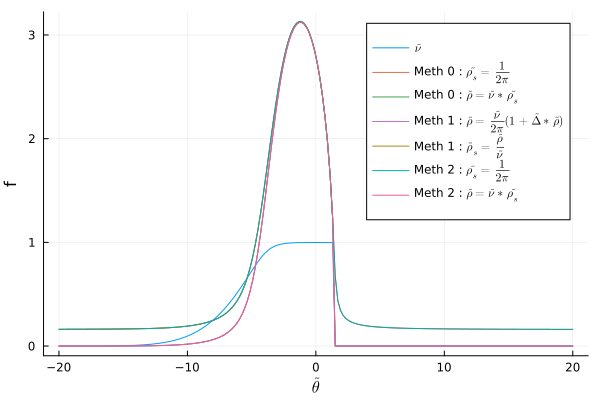

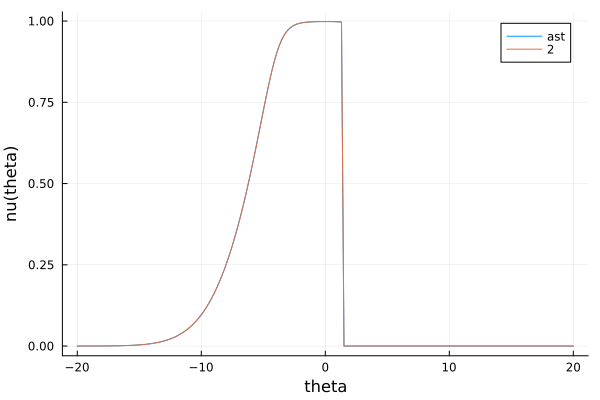

saved : 2024-02-27/nu_theta_star_1.0_discr_h_46.599_200.000.npz
veff (1.468) = 0.000


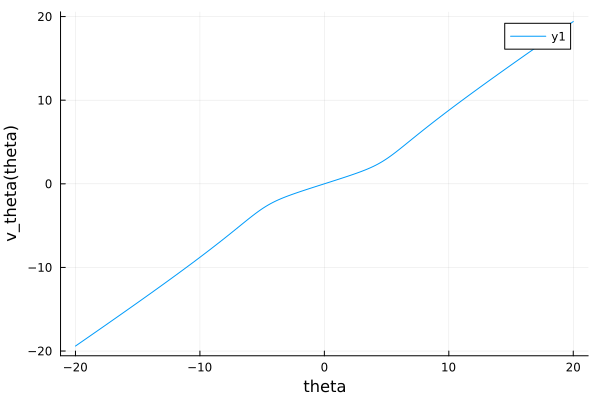

veff (0.302) = -0.856
veff (0.503) = -0.707
veff (0.704) = -0.559
veff (0.905) = -0.412
veff (1.106) = -0.265
veff (1.307) = -0.118
veff (1.508) = 0.029
veff (1.709) = 0.176
veff (1.910) = 0.322
veff (2.111) = 0.468
veff (2.312) = 0.615
veff (2.513) = 0.761
veff (2.714) = 0.908
theta_star = 1.468 


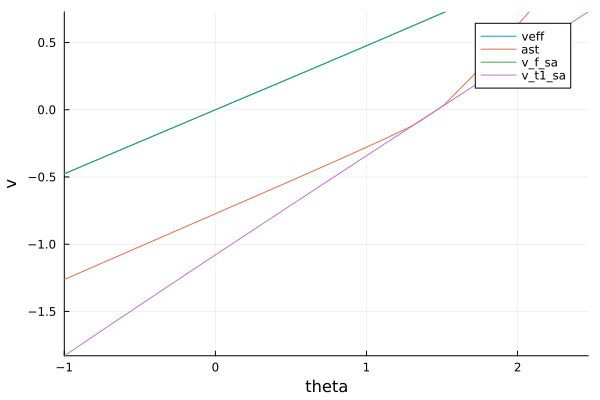

  0.001573 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-27/rho_s_theta_star_1.0_discr_h_46.599_200.000.npz
  0.000010 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-27/rho_theta_star_1.0_discr_h_46.599_200.000.npz
  0.000010 seconds (4 allocations: 1.922 KiB)
  0.000007 seconds (4 allocations: 1.922 KiB)


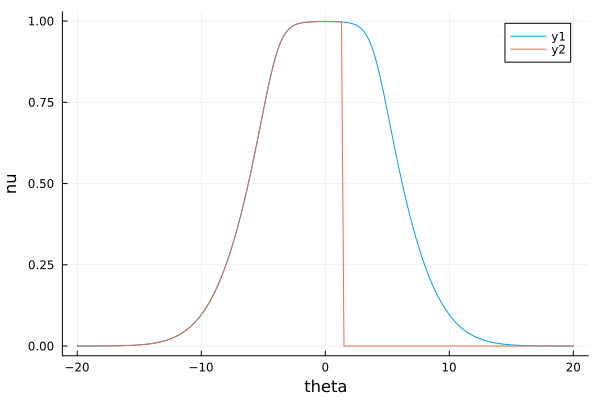

0.02702702702702703

In [17]:
#new_date = "2024-02-09"
nom = "theta_star_1.0_h"

# Paramètres supplémentaires
n_p = "None"                    # um^{-1}
T = 200               # nK

#mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
mup = 49*kB #kg um^2.ms^-1
n_p = (((mup / (hbar * om_perp)) + 1)^2 - 1) / (4 * a3D)
Nat = 700
#Taille = Nat/n_p    # Taille de la boîte (microns)

# ou on fixe Taille
Taille = 37 #mu m 
n_p = Nat/Taille*9/4
println(n_p)

#n_p = 40                     # um^{-1}
#T = 100                # nK
#Taille = 37.    # Taille de la boîte (microns)
mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
#mup = g * n_p   #kg um^2.ms^-1


theta_max = 20
npts = 200
theta_discr = LinRange(-theta_max, theta_max , npts) 

#------------------------------------------------------------------------------------------------
#	Fonction pour calculer les nu , rho et rho_s et predire cest fonction apres la coupure 1 
#-
function save_nu_rho_rho_s(new_date , nom , theta_discr, n_p  , mup , T , Taille , gbar )
    if mup == "None" 
       mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
    else 
        n_p = (((mup / (hbar * om_perp)) + 1)^2 - 1) / (4 * a3D)
    end
    # Discrétisation de theta
    beta = [-mup / (kB * T) 0 mass * g^2/(kB * T * hbar^2)]
    beta = [-mup / (kB * T) 0 mass /(kB * T)]

    # Définir la date sous forme de chaîne

    index_last_underscore = findlast(isequal('_'), nom)

    
    filename = @sprintf "%s/theta_discr_%s.npz" new_date nom[index_last_underscore+1:end]
    npzwrite(filename, theta_discr )
    println("saved : ", filename)  

    @time nu_discr = yangyang(gbar, beta, theta_discr)
    println("size : ", size(nu_discr)[1])
    filename = @sprintf "%s/nu_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, nu_discr )
    println("saved : ", filename)
    montrer_les_rho(theta_discr , nu_discr)

    @time rho_s_discr = 0.5 / pi * mass/hbar*dress(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]))
    filename = @sprintf "%s/rho_s_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_s_discr )
    println("saved : ", filename)

    @time rho_discr = nu_discr .* rho_s_discr
    filename = @sprintf "%s/rho_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_discr )
    println("saved : ", filename)

    @time theta_star = find_theta_star(theta_discr, nu_discr ,gbar)
    filename = @sprintf "%s/%s_%.3f_%.3f.npz" new_date nom mup/kB T
    npzwrite(filename, theta_star )
    println("saved : ", filename)

    @time nu_theta_star_discr = find_nu_theta_star_discr(theta_discr , theta_star  , nu_discr )
    filename = @sprintf "%s/nu_%s_discr_%s_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T
    montrer_les_rho(theta_discr , nu_theta_star_discr)
    p = plot(xlabel="theta", ylabel="nu(theta)", legend=:topright)
    plot!(p, theta_discr,  nu_theta_star_discr , label = "ast")
    nu_theta_star_discr = Float64.(nu_theta_star_discr)
    plot!(p, theta_discr,  nu_theta_star_discr , label = "2")
    display(p)
    npzwrite(filename, nu_theta_star_discr )
    println("saved : ", filename)
    
    f_veff_star_theta_star = theta_star -> linear_interpolation(theta_discr, veff( gbar, theta_discr, ifelse.(theta_discr .> theta_star, 0, nu_discr)))(theta_star)
    println( @sprintf "veff (%.3f) = %.3f" theta_star f_veff_star_theta_star(theta_star))
    p = plot(xlabel="theta", ylabel="v_theta(theta)", legend=:topright)
    plot!(p, theta_discr,  f_veff_star_theta_star(theta_discr) )
    display(p)
    
    function f_veff_star_theta_star_2(theta_star, theta_discr, veff, gbar, nu_discr)
        #nu_theta_star_discr = find_nu_theta_star_discr(theta_discr, theta_star, nu_discr)
        nu_theta_star_discr_ast = ifelse.(theta_discr .> theta_star, 0, nu_discr)
        v_eff = veff(gbar, theta_discr, nu_theta_star_discr_ast)
        interpolation = LinearInterpolation(theta_discr, v_eff)
        return interpolation(theta_star)
    end

    # Calculer f_veff_star_theta_star pour chaque élément de theta_star
    #f_veff_star_theta_star_vector = [f_veff_star_theta_star_2(theta_star, theta_discr, veff, gbar, nu_discr) for theta_star in theta_star]
    #display(f_veff_star_theta_star_vector)
    f_veff_star_theta_star_vector_1 = zeros(npts)
    f_veff_star_theta_star_vector_2 = zeros(npts)
    for i = 1:npts
        f_veff_star_theta_star_vector_1[i] = f_veff_star_theta_star(theta_discr[i])
        f_veff_star_theta_star_vector_2[i] = f_veff_star_theta_star_2(theta_discr[i], theta_discr, veff, gbar, nu_discr)
    end
    # Affichage des résultats
    for (theta_star_value, f_value) in zip(theta_discr, f_veff_star_theta_star_vector_2)
        if abs.(f_value)<1 
            println(@sprintf "veff (%.3f) = %.3f" theta_star_value f_value)
        end
    end
    
    # Tracé de la fonction f_veff_star_theta_star
    #p = plot(xlabel="theta", ylabel="v_theta(theta)", legend=:topright)
    #plot!(p, theta_discr, f_veff_star_theta_star_vector)
    #display(p)
    
    theta_star = fzero(f_veff_star_theta_star, theta_star-1 , theta_star+1)
    println(@sprintf "theta_star = %.3f " theta_star)

    p = plot(xlabel="theta", ylabel="v", legend=:topright)
    #plot!(p, theta_discr,  nu_discr  ,label = "nu" )
    #plot!(p, theta_discr,  nu_theta_star_discr , label = " nu ast")
    plot!(p, theta_discr,  veff(gbar , theta_discr, nu_discr ) ,label = "veff" )
    plot!(p, theta_discr,  veff(gbar , theta_discr, nu_theta_star_discr) , label = "ast")
    #plot!(p, theta_discr,  veff(gbar , theta_discr, nu_discr )-veff(gbar , theta_discr, nu_theta_star_discr) , label = "ast")
    plot!(p, theta_discr,   f_veff_star_theta_star(theta_discr) , label = "v_f_sa")
    plot!(p, theta_discr,   f_veff_star_theta_star_vector_1 , label = "v_t1_sa")
    #plot!(p, theta_discr,   f_veff_star_theta_star_vector_2 , label = "v_t2_sa") 
    #vline!(p, [theta_star], linestyle=:dash, color=:red, linewidth=2)
    #hline!(p, [f_veff_star_theta_star(theta_star)], linestyle=:dash, color=:red, linewidth=2)
    xlims!(p, -1 , theta_star+1 )
    ylims!(p, f_veff_star_theta_star(-1) , f_veff_star_theta_star(theta_star+1) )
    display(p)

    @time rho_s_theta_star_discr = 0.5 / pi * mass/hbar * dress(gbar, theta_discr, nu_theta_star_discr, ones(size(theta_discr)[1]))
    filename = @sprintf "%s/rho_s_%s_discr_%s_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_s_theta_star_discr )
    println("saved : ", filename)

    @time rho_theta_star_discr = nu_theta_star_discr .* rho_s_theta_star_discr
    filename = @sprintf "%s/rho_%s_discr_%s_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_theta_star_discr )
    println("saved : ", filename)
    
    return theta_discr , nu_discr , rho_s_discr , rho_discr , theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr

end 

theta_discr , nu_discr , rho_s_discr , rho_discr , theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )

#------------------------------------------------------------------------------------------------
#	function for simulating box expansion. Writes results in file 'data/density_expansion_t.npd'
#     where 't' is the time (takes a list of times to be saved as argument)
#------------------------------------------------------------------------------------------------
filename0 = @sprintf "%s/density_expansion_nu_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)

function box_expansion(n_fun, dt, list_t_save, theta_max, npts, gb, ratio_m_hbar)
    tmax = maximum(list_t_save)
    theta_tab = LinRange(-theta_max, theta_max, npts)
    x1 = -0.5 * ones(npts) + 0.0000001*theta_tab
    x2 = 0.5 * ones(npts) + 0.0000001*theta_tab

    t = 0

    mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
    println(@sprintf "t = %.3f saved" t*Taille)
    filename = filename0 * @sprintf("%.3f.npz", Float64(t))
    println("saved : ", filename)
    npzwrite(filename, mydensity)

    p = plot(xlabel="x", ylabel="n", legend=:topright)
    plot!(p, mydensity[1,:],  mydensity[2,:] )
    display(p)
    while t<=tmax
        x1, x2 = evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
        t += dt

        for ts in list_t_save
            if t-dt<=ts && ts<=t
                mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
                println(@sprintf "t = %.3f saved" t*Taille)
                filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                println("saved : ", filename)
                npzwrite(filename, mydensity)
                
                p = plot(xlabel="x", ylabel="n", legend=:topright)
                plot!(p, mydensity[1,:],  mydensity[2,:] )
                display(p)
            end
        end
    end
end

using Interpolations

# Créer l'interpolation
@time nu_fun = LinearInterpolation(theta_discr, nu_discr)
@time nu_fun = LinearInterpolation(theta_discr, nu_theta_star_discr)

# Afficher l'interpolation
p = plot(xlabel="theta", ylabel="nu", legend=:topright)
plot!(p, theta_discr,  nu_discr )
plot!(p, theta_discr, nu_fun(theta_discr))
display(p)

temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille ]
temps_sav = [ 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille, 50.0/Taille ]
dt = 0.9/Taille
temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
dt = 1/Taille
#box_expansion(nu_fun, dt ,temps_sav  , theta_max , npts , gbar, mass/hbar)



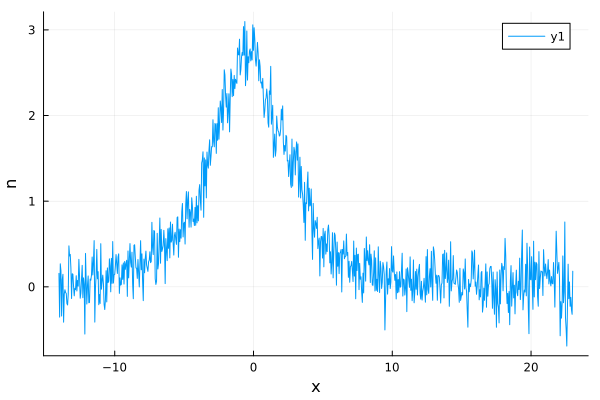

lower_bounds = [24.5, 100.0]
upper_bounds = [73.5, 300.0]
mup = 49.0
T = 200.0
saved : 2024-02-27/theta_discr_h.npz
  0.063187 seconds (4.89 k allocations: 8.735 MiB, 59.65% gc time)
size : 200
saved : 2024-02-27/nu_discr_h_49.000_200.000.npz


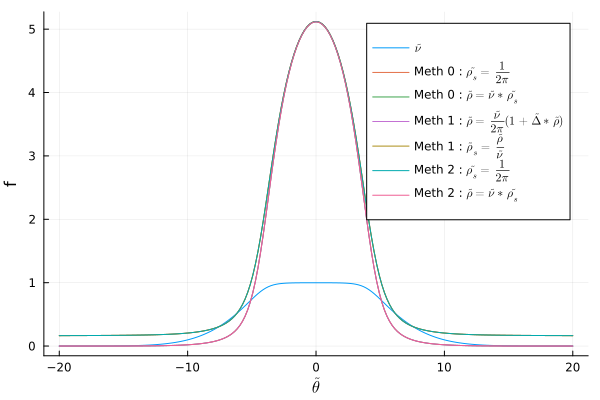

  0.002455 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-27/rho_s_discr_h_49.000_200.000.npz
  0.000018 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-27/rho_discr_h_49.000_200.000.npz
  0.588010 seconds (15.38 M allocations: 374.008 MiB, 17.55% gc time)
saved : 2024-02-27/theta_star_1.0_h_49.000_200.000.npz
  0.000016 seconds (111 allocations: 5.266 KiB)
saved : 2024-02-27/nu_theta_star_1.0_discr_h_49.000_200.000.npz
veff (1.519) = -0.000
  0.001521 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-27/rho_s_theta_star_1.0_discr_h_49.000_200.000.npz
  0.000010 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-27/rho_theta_star_1.0_discr_h_49.000_200.000.npz
  0.000008 seconds (4 allocations: 1.922 KiB)
t = 0.000 saved
saved : 2024-02-27/density_expansion_nu_theta_star_1.0_h_49.000_200.000_37.000_0.000.npz


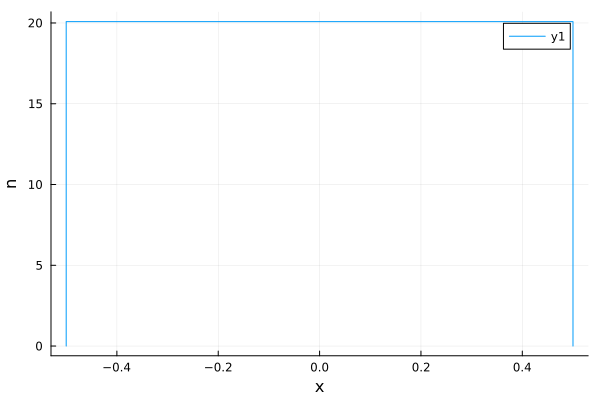

t = 51.000 saved
saved : 2024-02-27/density_expansion_nu_theta_star_1.0_h_49.000_200.000_37.000_51.000.npz


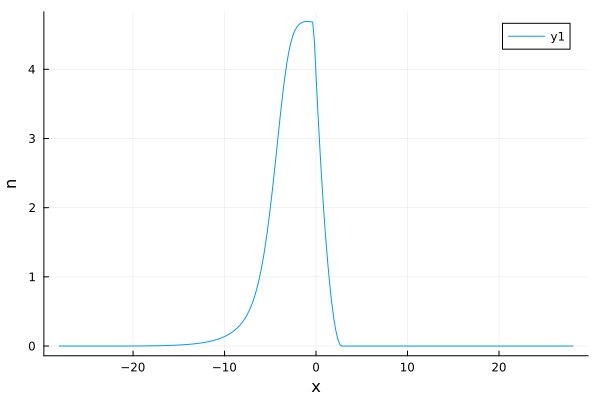

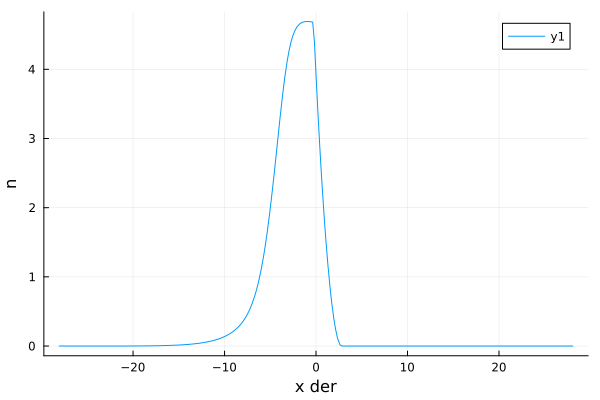

lol


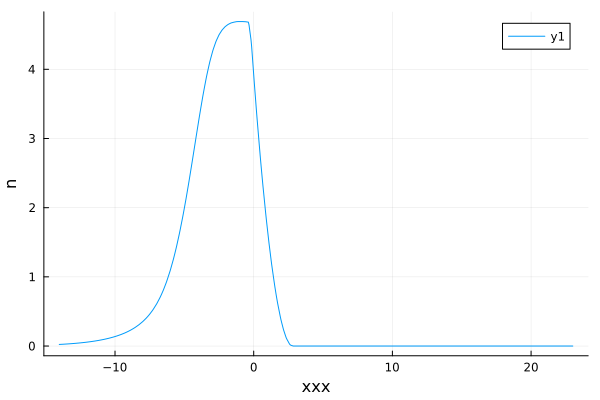

mup = 49.0
T = 200.0
saved : 2024-02-27/theta_discr_h.npz
  0.014732 seconds (4.89 k allocations: 8.735 MiB)
size : 200
saved : 2024-02-27/nu_discr_h_49.000_200.000.npz


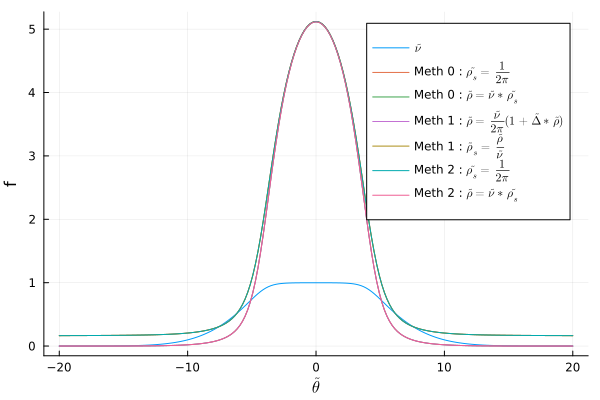

  0.001601 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-27/rho_s_discr_h_49.000_200.000.npz
  0.000029 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-27/rho_discr_h_49.000_200.000.npz
  0.601919 seconds (15.38 M allocations: 374.008 MiB, 19.35% gc time)
saved : 2024-02-27/theta_star_1.0_h_49.000_200.000.npz
  0.000008 seconds (111 allocations: 5.266 KiB)
saved : 2024-02-27/nu_theta_star_1.0_discr_h_49.000_200.000.npz
veff (1.519) = -0.000
  0.001469 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-27/rho_s_theta_star_1.0_discr_h_49.000_200.000.npz
  0.000013 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-27/rho_theta_star_1.0_discr_h_49.000_200.000.npz
  0.000016 seconds (4 allocations: 1.922 KiB)
t = 0.000 saved
saved : 2024-02-27/density_expansion_nu_theta_star_1.0_h_49.000_200.000_37.000_0.000.npz


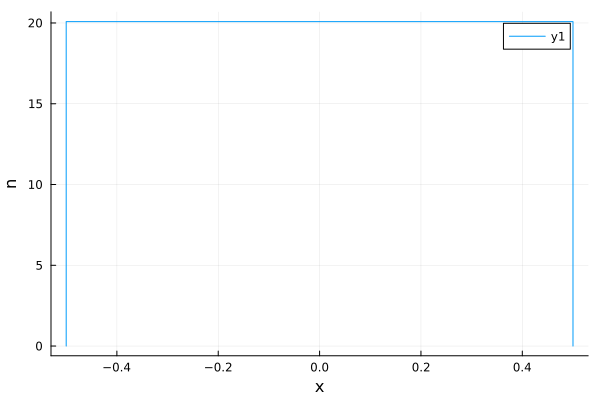

t = 51.000 saved
saved : 2024-02-27/density_expansion_nu_theta_star_1.0_h_49.000_200.000_37.000_51.000.npz


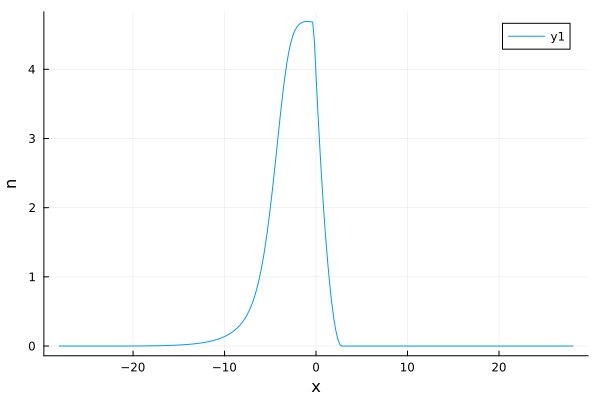

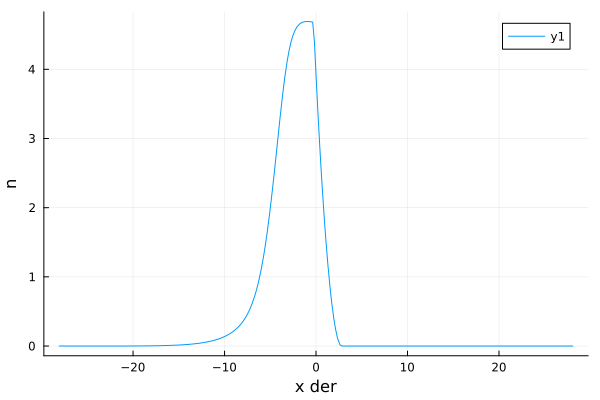

lol


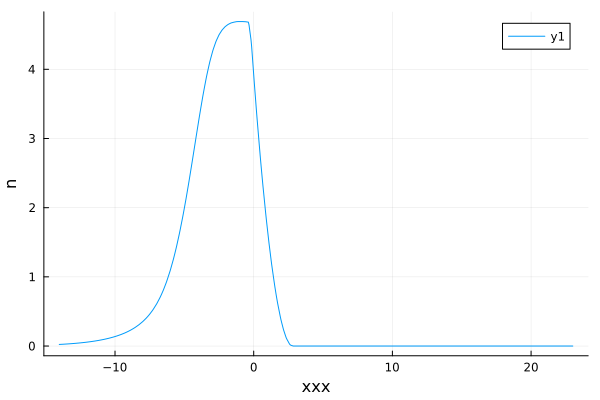

mup = 49.00029671726817
T = 200.0
saved : 2024-02-27/theta_discr_h.npz
  0.013488 seconds (4.89 k allocations: 8.735 MiB)
size : 200
saved : 2024-02-27/nu_discr_h_49.000_200.000.npz


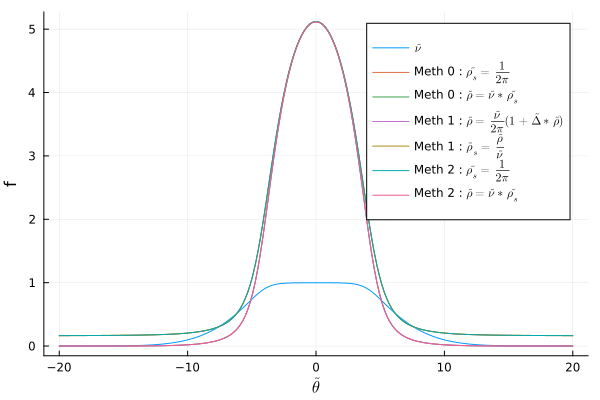

  0.001614 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-27/rho_s_discr_h_49.000_200.000.npz
  0.000011 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-27/rho_discr_h_49.000_200.000.npz
  0.594310 seconds (15.38 M allocations: 374.008 MiB, 19.28% gc time)
saved : 2024-02-27/theta_star_1.0_h_49.000_200.000.npz
  0.000005 seconds (111 allocations: 5.266 KiB)
saved : 2024-02-27/nu_theta_star_1.0_discr_h_49.000_200.000.npz
veff (1.519) = -0.000
  0.001449 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-27/rho_s_theta_star_1.0_discr_h_49.000_200.000.npz
  0.000009 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-27/rho_theta_star_1.0_discr_h_49.000_200.000.npz
  0.000010 seconds (4 allocations: 1.922 KiB)
t = 0.000 saved
saved : 2024-02-27/density_expansion_nu_theta_star_1.0_h_49.000_200.000_37.000_0.000.npz


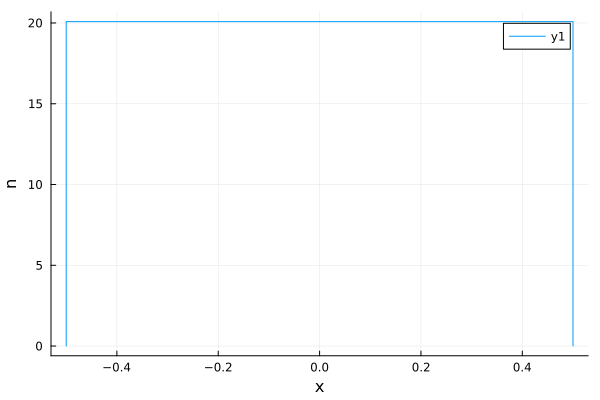

t = 51.000 saved
saved : 2024-02-27/density_expansion_nu_theta_star_1.0_h_49.000_200.000_37.000_51.000.npz


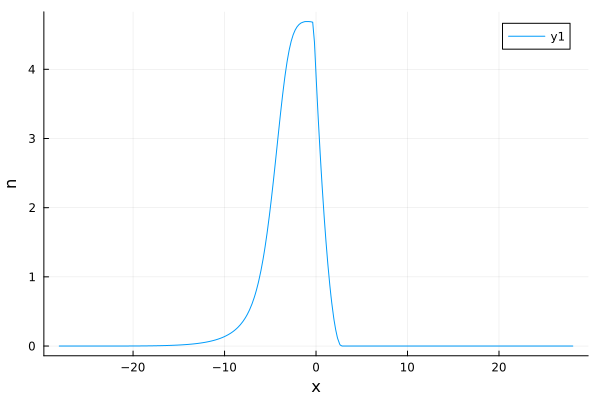

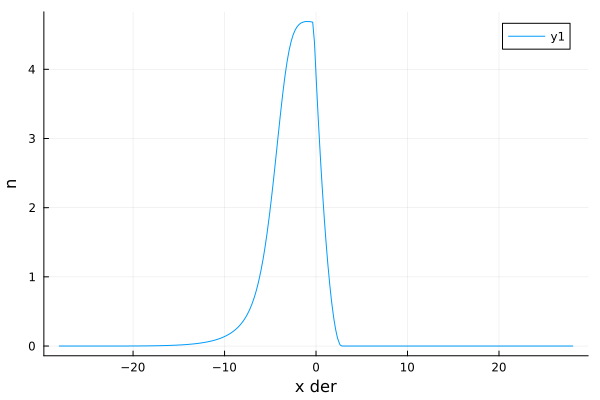

lol


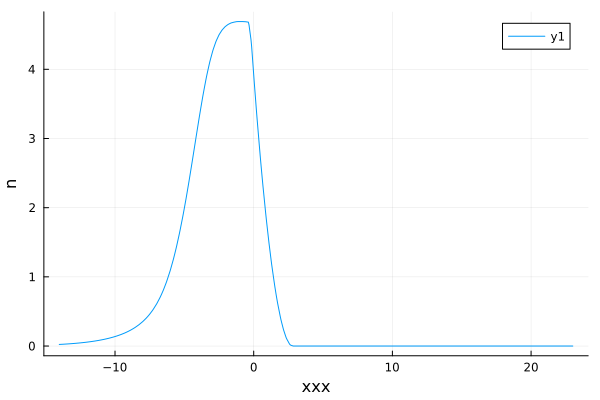

mup = 48.99970328273183
T = 200.0
saved : 2024-02-27/theta_discr_h.npz
  0.016731 seconds (4.89 k allocations: 8.735 MiB, 19.37% gc time)
size : 200
saved : 2024-02-27/nu_discr_h_49.000_200.000.npz


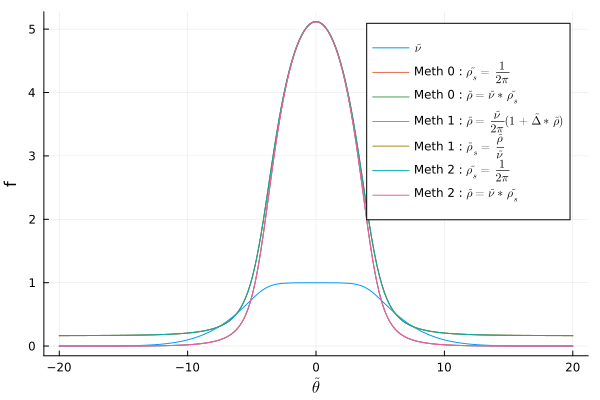

  0.001574 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-27/rho_s_discr_h_49.000_200.000.npz
  0.000030 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-27/rho_discr_h_49.000_200.000.npz
  0.580091 seconds (15.38 M allocations: 374.008 MiB, 17.29% gc time)
saved : 2024-02-27/theta_star_1.0_h_49.000_200.000.npz
  0.000006 seconds (111 allocations: 5.266 KiB)
saved : 2024-02-27/nu_theta_star_1.0_discr_h_49.000_200.000.npz
veff (1.519) = -0.000
  0.001503 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-27/rho_s_theta_star_1.0_discr_h_49.000_200.000.npz
  0.000008 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-27/rho_theta_star_1.0_discr_h_49.000_200.000.npz
  0.000013 seconds (4 allocations: 1.922 KiB)
t = 0.000 saved
saved : 2024-02-27/density_expansion_nu_theta_star_1.0_h_49.000_200.000_37.000_0.000.npz


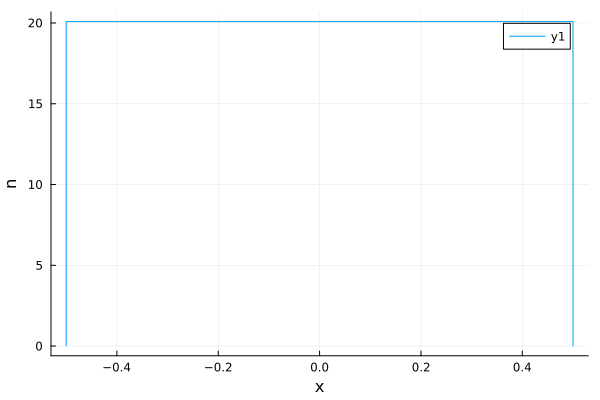

t = 51.000 saved
saved : 2024-02-27/density_expansion_nu_theta_star_1.0_h_49.000_200.000_37.000_51.000.npz


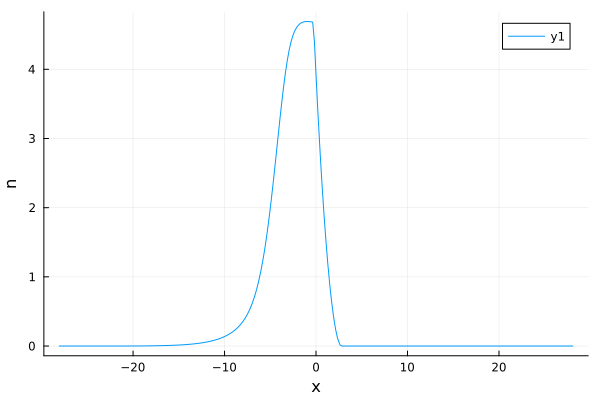

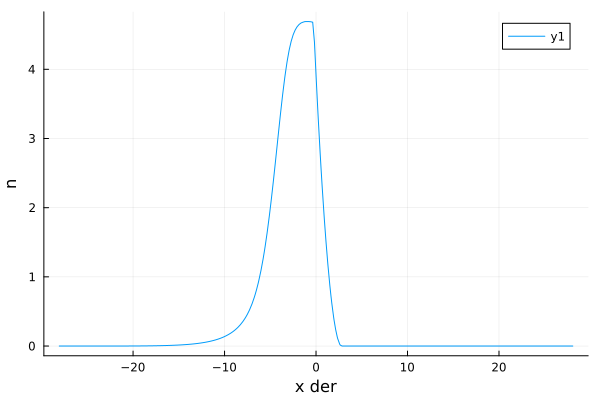

lol


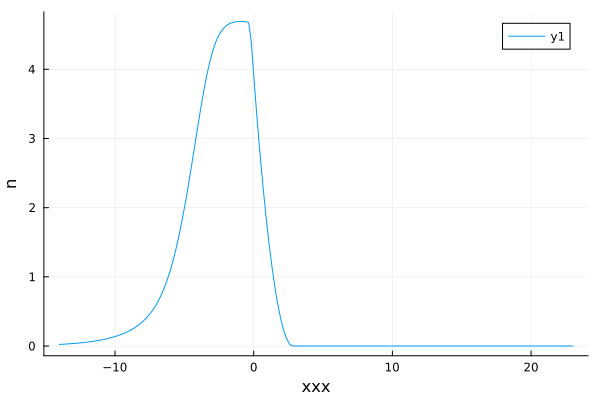

mup = 49.0
T = 200.00121109089048
saved : 2024-02-27/theta_discr_h.npz
  0.016784 seconds (4.89 k allocations: 8.735 MiB, 19.48% gc time)
size : 200
saved : 2024-02-27/nu_discr_h_49.000_200.001.npz


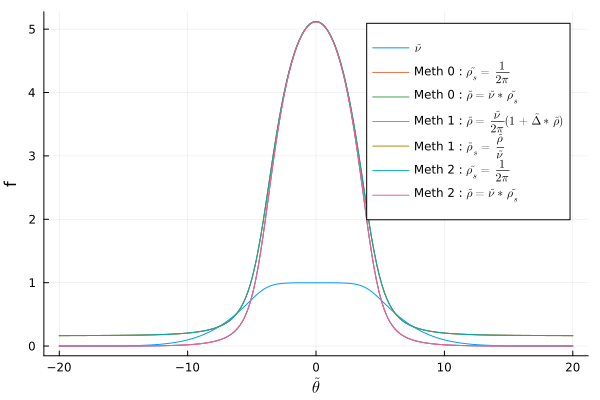

  0.001558 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-27/rho_s_discr_h_49.000_200.001.npz
  0.000011 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-27/rho_discr_h_49.000_200.001.npz
  0.580826 seconds (15.38 M allocations: 374.008 MiB, 17.66% gc time)
saved : 2024-02-27/theta_star_1.0_h_49.000_200.001.npz
  0.000006 seconds (111 allocations: 5.266 KiB)
saved : 2024-02-27/nu_theta_star_1.0_discr_h_49.000_200.001.npz
veff (1.519) = 0.000
  0.001522 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-27/rho_s_theta_star_1.0_discr_h_49.000_200.001.npz
  0.000010 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-27/rho_theta_star_1.0_discr_h_49.000_200.001.npz
  0.000009 seconds (4 allocations: 1.922 KiB)
t = 0.000 saved
saved : 2024-02-27/density_expansion_nu_theta_star_1.0_h_49.000_200.001_37.000_0.000.npz


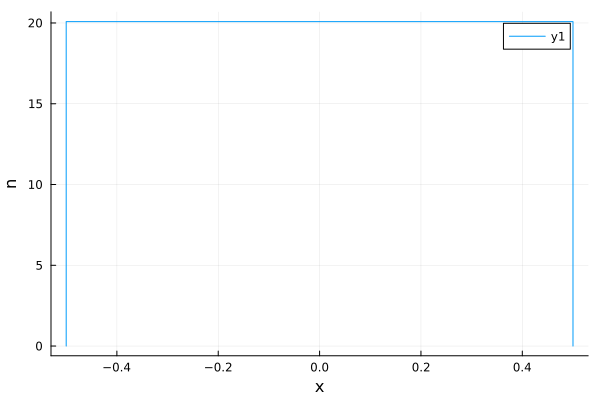

t = 51.000 saved
saved : 2024-02-27/density_expansion_nu_theta_star_1.0_h_49.000_200.001_37.000_51.000.npz


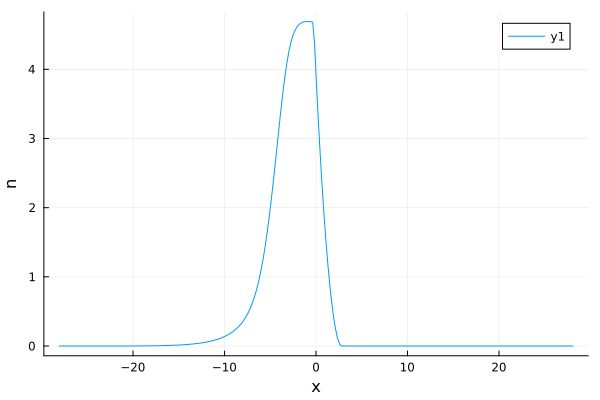

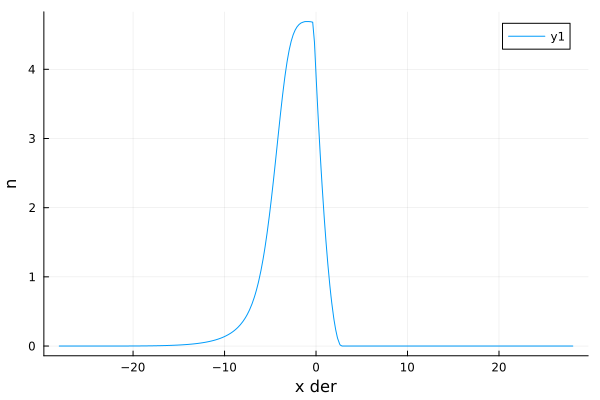

lol


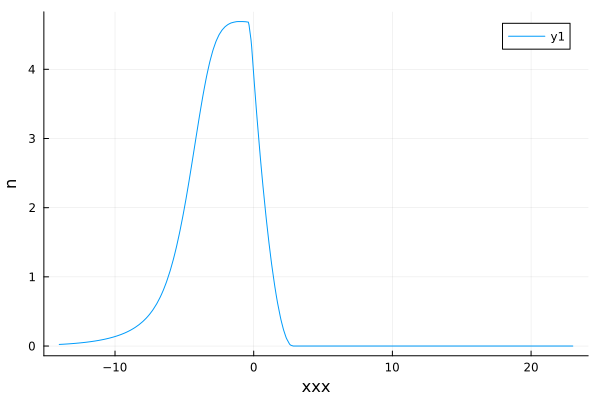

mup = 49.0
T = 199.99878890910952
saved : 2024-02-27/theta_discr_h.npz
  0.013466 seconds (4.89 k allocations: 8.735 MiB)
size : 200
saved : 2024-02-27/nu_discr_h_49.000_199.999.npz


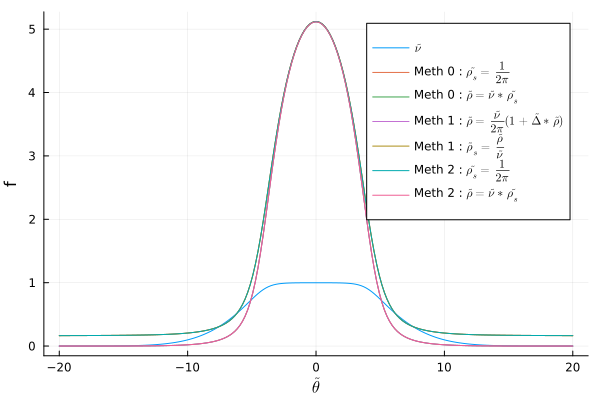

  0.001638 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-27/rho_s_discr_h_49.000_199.999.npz
  0.000015 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-27/rho_discr_h_49.000_199.999.npz
  0.585470 seconds (15.38 M allocations: 374.008 MiB, 17.78% gc time)
saved : 2024-02-27/theta_star_1.0_h_49.000_199.999.npz
  0.000005 seconds (111 allocations: 5.266 KiB)
saved : 2024-02-27/nu_theta_star_1.0_discr_h_49.000_199.999.npz
veff (1.519) = -0.000
  0.001552 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-27/rho_s_theta_star_1.0_discr_h_49.000_199.999.npz
  0.000010 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-27/rho_theta_star_1.0_discr_h_49.000_199.999.npz
  0.000010 seconds (4 allocations: 1.922 KiB)
t = 0.000 saved
saved : 2024-02-27/density_expansion_nu_theta_star_1.0_h_49.000_199.999_37.000_0.000.npz


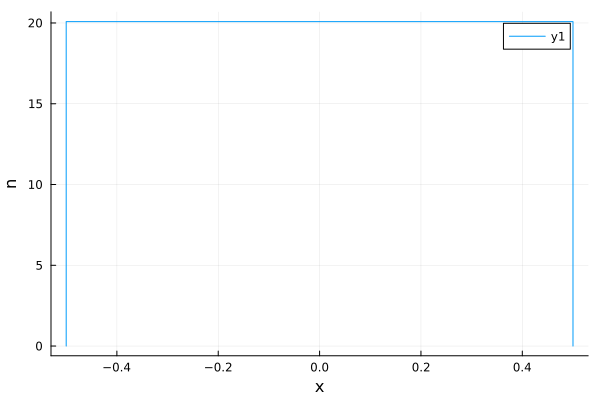

t = 51.000 saved
saved : 2024-02-27/density_expansion_nu_theta_star_1.0_h_49.000_199.999_37.000_51.000.npz


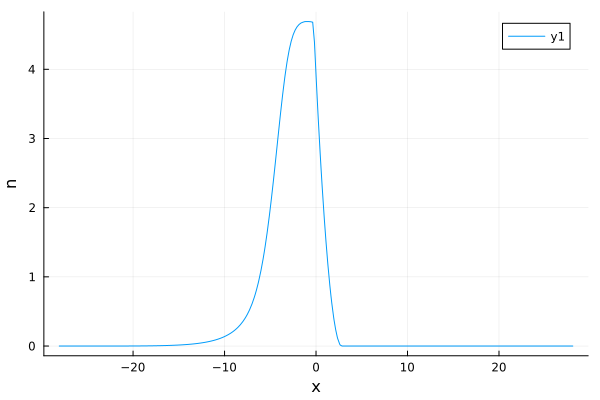

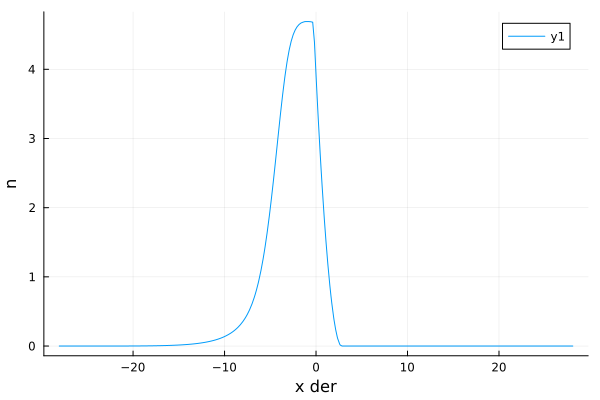

lol


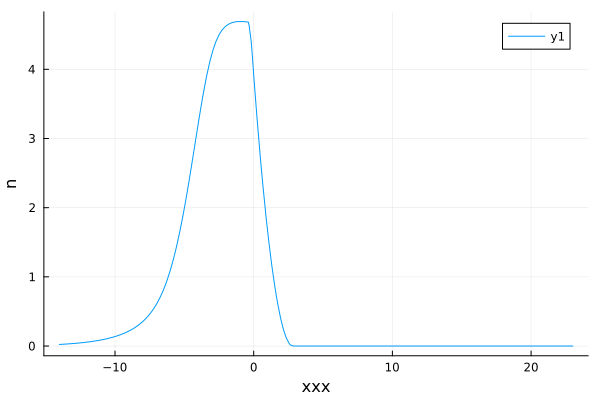

LoadError: MethodError: no method matching mul!(::Vector{Float64}, ::Transpose{Float64, Matrix{Float64}}, ::Matrix{Float64}, ::Bool, ::Bool)

[0mClosest candidates are:
[0m  mul!(::StridedVector{T}, ::Transpose{<:Any, <:StridedVecOrMat{T}}, [91m::StridedVector{T}[39m, ::Number, ::Number) where T<:Union{Float32, Float64, ComplexF64, ComplexF32}
[0m[90m   @[39m [32mLinearAlgebra[39m [90m~/julia-1.9.3/share/julia/stdlib/v1.9/LinearAlgebra/src/[39m[90m[4mmatmul.jl:93[24m[39m
[0m  mul!([91m::StridedMatrix{T}[39m, ::Transpose{<:Any, <:StridedVecOrMat{T}}, ::StridedVecOrMat{T}, ::Number, ::Number) where T<:Union{Float32, Float64, ComplexF64, ComplexF32}
[0m[90m   @[39m [32mLinearAlgebra[39m [90m~/julia-1.9.3/share/julia/stdlib/v1.9/LinearAlgebra/src/[39m[90m[4mmatmul.jl:372[24m[39m
[0m  mul!(::StridedVecOrMat, [91m::SparseArrays.AbstractSparseMatrixCSC[39m, ::Union{Adjoint{<:Any, <:Union{LowerTriangular, UnitLowerTriangular, UnitUpperTriangular, UpperTriangular, StridedMatrix, BitMatrix}}, LowerTriangular, Transpose{<:Any, <:Union{LowerTriangular, UnitLowerTriangular, UnitUpperTriangular, UpperTriangular, StridedMatrix, BitMatrix}}, UnitLowerTriangular, UnitUpperTriangular, UpperTriangular, StridedVector, StridedMatrix, BitMatrix, BitVector}, ::Number, ::Number)
[0m[90m   @[39m [36mSparseArrays[39m [90m~/julia-1.9.3/share/julia/stdlib/v1.9/SparseArrays/src/[39m[90m[4mlinalg.jl:30[24m[39m
[0m  ...


In [47]:
using DelimitedFiles

date_donnees = "2024-02-09"

DONNEES = []

if date_donnees == "None"
    fichier_x = "Scan43_coupure2_1ms_x.txt"
    fichier_y = "Scan43_coupure2_1ms_n.txt"
    Donnees = [readdlm("2024-02-05/Donnees/$(fichier_x)") , reverse(readdlm("2024-02-05/Donnees/$(fichier_y)")) * 0 , "2em coupure 1ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_coupure1_10ms_x.txt"
    fichier_y = "Scan43_coupure1_10ms_n.txt"
    Donnees = [readdlm("2024-02-05/Donnees/$(fichier_x)") , reverse(readdlm("2024-02-05/Donnees/$(fichier_y)")) * 0 , "1er coupure 10 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_x.txt"
    fichier_y = "Scan43_n.txt"
    Donnees = [readdlm("2024-02-05/Donnees/$(fichier_x)") , reverse(readdlm("2024-02-05/Donnees/$(fichier_y)")) * 0 , "2em coupure 40 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-02-05"
    fichier_x = "Scan43_coupure2_1ms_x.txt"
    fichier_y = "Scan43_coupure2_1ms_n.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , reverse(readdlm("$(date_donnees)/Donnees/$(fichier_y)")) , "2em coupure 1ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_coupure1_10ms_x.txt"
    fichier_y = "Scan43_coupure1_10ms_n.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , reverse(readdlm("$(date_donnees)/Donnees/$(fichier_y)")) , "1er coupure 10 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_x.txt"
    fichier_y = "Scan43_n.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , reverse(readdlm("$(date_donnees)/Donnees/$(fichier_y)")) , "2em coupure 40 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-02-09"
    fichier_x = "X_Scan704_18ms.txt"
    fichier_y = "Y_Scan704_18ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "Première coupure expansion 18 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_Scan696_1ms.txt"
    fichier_y = "Y_Scan696_1ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "Seconde coupure sélection 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_Scan696_50ms.txt"
    fichier_y = "Y_Scan696_50ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "Seconde coupure expansion 50 ms"]
    push!(DONNEES, Donnees)
end

theta_discr = LinRange(-theta_max, theta_max , npts)                           

 #------------------------------------------------------------------------------------------------
#	Fonction pour calculer les nu , rho et rho_s et predire cest fonction apres la coupure 1 
#-
function save_nu_rho_rho_s(new_date , nom , theta_discr, n_p  , mup , T , Taille , gbar )
    if mup == "None" 
       mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
    else 
        n_p = (((mup / (hbar * om_perp)) + 1)^2 - 1) / (4 * a3D)
    end
    # Discrétisation de theta
    beta = [-mup / (kB * T) 0 mass * g^2/(kB * T * hbar^2)]
    beta = [-mup / (kB * T) 0 mass /(kB * T)]

    # Définir la date sous forme de chaîne

    index_last_underscore = findlast(isequal('_'), nom)

    
    filename = @sprintf "%s/theta_discr_%s.npz" new_date nom[index_last_underscore+1:end]
    npzwrite(filename, theta_discr )
    println("saved : ", filename)  

    @time nu_discr = yangyang(gbar, beta, theta_discr)
    println("size : ", size(nu_discr)[1])
    filename = @sprintf "%s/nu_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, nu_discr )
    println("saved : ", filename)
    montrer_les_rho(theta_discr , nu_discr)

    @time rho_s_discr = 0.5 / pi * mass/hbar*dress(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]))
    filename = @sprintf "%s/rho_s_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_s_discr )
    println("saved : ", filename)

    @time rho_discr = nu_discr .* rho_s_discr
    filename = @sprintf "%s/rho_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_discr )
    println("saved : ", filename)

    @time theta_star = find_theta_star(theta_discr, nu_discr ,gbar)
    filename = @sprintf "%s/%s_%.3f_%.3f.npz" new_date nom mup/kB T
    npzwrite(filename, theta_star )
    println("saved : ", filename)

    @time nu_theta_star_discr = find_nu_theta_star_discr(theta_discr , theta_star  , nu_discr )
    filename = @sprintf "%s/nu_%s_discr_%s_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T
    """
    montrer_les_rho(theta_discr , nu_theta_star_discr)
    p = plot(xlabel="theta", ylabel="nu(theta)", legend=:topright)
    plot!(p, theta_discr,  nu_theta_star_discr , label = "ast")
    """
    nu_theta_star_discr = Float64.(nu_theta_star_discr)
    """
    plot!(p, theta_discr,  nu_theta_star_discr , label = "2")
    display(p)
    """
    npzwrite(filename, nu_theta_star_discr )
    println("saved : ", filename)
    
    f_veff_star_theta_star = theta_star -> linear_interpolation(theta_discr, veff( gbar, theta_discr, ifelse.(theta_discr .> theta_star, 0, nu_discr)))(theta_star)
    println( @sprintf "veff (%.3f) = %.3f" theta_star f_veff_star_theta_star(theta_star))
    
    """                                    
    p = plot(xlabel="theta", ylabel="v_theta(theta)", legend=:topright)
    plot!(p, theta_discr,  f_veff_star_theta_star(theta_discr) )
    display(p)
    
    function f_veff_star_theta_star_2(theta_star, theta_discr, veff, gbar, nu_discr)
        #nu_theta_star_discr = find_nu_theta_star_discr(theta_discr, theta_star, nu_discr)
        nu_theta_star_discr_ast = ifelse.(theta_discr .> theta_star, 0, nu_discr)
        v_eff = veff(gbar, theta_discr, nu_theta_star_discr_ast)
        interpolation = LinearInterpolation(theta_discr, v_eff)
        return interpolation(theta_star)
    end
    
    # Calculer f_veff_star_theta_star pour chaque élément de theta_star
    #f_veff_star_theta_star_vector = [f_veff_star_theta_star_2(theta_star, theta_discr, veff, gbar, nu_discr) for theta_star in theta_star]
    #display(f_veff_star_theta_star_vector)
    f_veff_star_theta_star_vector_1 = zeros(npts)
    f_veff_star_theta_star_vector_2 = zeros(npts)
    for i = 1:npts
        f_veff_star_theta_star_vector_1[i] = f_veff_star_theta_star(theta_discr[i])
        f_veff_star_theta_star_vector_2[i] = f_veff_star_theta_star_2(theta_discr[i], theta_discr, veff, gbar, nu_discr)
    end
    # Affichage des résultats
    for (theta_star_value, f_value) in zip(theta_discr, f_veff_star_theta_star_vector_2)
        if abs.(f_value)<1 
            println(@sprintf "veff (%.3f) = %.3f" theta_star_value f_value)
        end
    end
    
    # Tracé de la fonction f_veff_star_theta_star
    #p = plot(xlabel="theta", ylabel="v_theta(theta)", legend=:topright)
    #plot!(p, theta_discr, f_veff_star_theta_star_vector)
    #display(p)
    
    theta_star = fzero(f_veff_star_theta_star, theta_star-1 , theta_star+1)
    println(@sprintf "theta_star = %.3f " theta_star)
    
    p = plot(xlabel="theta", ylabel="v", legend=:topright)
    #plot!(p, theta_discr,  nu_discr  ,label = "nu" )
    #plot!(p, theta_discr,  nu_theta_star_discr , label = " nu ast")
    plot!(p, theta_discr,  veff(gbar , theta_discr, nu_discr ) ,label = "veff" )
    plot!(p, theta_discr,  veff(gbar , theta_discr, nu_theta_star_discr) , label = "ast")
    #plot!(p, theta_discr,  veff(gbar , theta_discr, nu_discr )-veff(gbar , theta_discr, nu_theta_star_discr) , label = "ast")
    plot!(p, theta_discr,   f_veff_star_theta_star(theta_discr) , label = "v_f_sa")
    plot!(p, theta_discr,   f_veff_star_theta_star_vector_1 , label = "v_t1_sa")
    #plot!(p, theta_discr,   f_veff_star_theta_star_vector_2 , label = "v_t2_sa") 
    #vline!(p, [theta_star], linestyle=:dash, color=:red, linewidth=2)
    #hline!(p, [f_veff_star_theta_star(theta_star)], linestyle=:dash, color=:red, linewidth=2)
    xlims!(p, -1 , theta_star+1 )
    ylims!(p, f_veff_star_theta_star(-1) , f_veff_star_theta_star(theta_star+1) )
    display(p)
    """                                               
    
                                                    
    @time rho_s_theta_star_discr = 0.5 / pi * mass/hbar * dress(gbar, theta_discr, nu_theta_star_discr, ones(size(theta_discr)[1]))
    filename = @sprintf "%s/rho_s_%s_discr_%s_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_s_theta_star_discr )
    println("saved : ", filename)

    @time rho_theta_star_discr = nu_theta_star_discr .* rho_s_theta_star_discr
    filename = @sprintf "%s/rho_%s_discr_%s_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_theta_star_discr )
    println("saved : ", filename)
    
    return theta_discr , nu_discr , rho_s_discr , rho_discr , theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr

end 



                                                                    
function model(x,p)
    mup , T = p[1]*kB , p[2]
    println("mup = ", mup/kB)
    println("T = ", T)                                                   
    theta_discr = LinRange(-theta_max, theta_max , npts) 
    theta_discr , nu_discr , rho_s_discr , rho_discr , theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )
    @time nu_fun = LinearInterpolation(theta_discr, nu_theta_star_discr)
    filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)

    function box_expansion(n_fun, dt, list_t_save, theta_max, npts, gb, ratio_m_hbar)
        tmax = maximum(list_t_save)
        theta_tab = LinRange(-theta_max, theta_max, npts)
        x1 = -0.5 * ones(npts) + 0.0000001*theta_tab
        x2 = 0.5 * ones(npts) + 0.0000001*theta_tab

        t = 0

        mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
        println(@sprintf "t = %.3f saved" t*Taille)
        filename = filename0 * @sprintf("%.3f.npz", Float64(t))
        println("saved : ", filename)
        npzwrite(filename, mydensity)

        p = plot(xlabel="x", ylabel="n", legend=:topright)
        plot!(p, mydensity[1,:],  mydensity[2,:] )
        display(p)
        while t<=tmax
            x1, x2 = evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
            t += dt

            for ts in list_t_save
                if t-dt<=ts && ts<=t
                    mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
                    println(@sprintf "t = %.3f saved" t*Taille)
                    filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                    println("saved : ", filename)
                    npzwrite(filename, mydensity)

                    p = plot(xlabel="x", ylabel="n", legend=:topright)
                    plot!(p, mydensity[1,:],  mydensity[2,:] )
                    display(p)
                end
            end
        end
        p = plot(xlabel="x der", ylabel="n", legend=:topright)
        plot!(p, mydensity[1,:],  mydensity[2,:] )
        display(p)                                                                
        density_fun = LinearInterpolation(mydensity[1,:], mydensity[2,:])                                                                
        return density_fun                                                               
    end
    # Afficher l'interpolation
    #p = plot(xlabel="theta", ylabel="nu", legend=:topright)
    #plot!(p, theta_discr,  nu_discr )
    #plot!(p, theta_discr, nu_fun(theta_discr))
    #display(p)

    temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille ]
    temps_sav = [ 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille, 50.0/Taille ]
    dt = 0.9/Taille
    temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
    temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
    dt = 1/Taille
    temps_sav = [ 50.0/Taille  ]
    dt = 51/Taille                                                                    
                                                        
                                        
    density_fun = box_expansion(nu_fun, dt ,temps_sav  , theta_max , npts , gbar, mass/hbar)
    println("lol")
    p = plot(xlabel="xxx", ylabel="n", legend=:topright)
    plot!(p, x,  density_fun.(x))
    display(p)
    return density_fun.(x)
end

x_data = DONNEES[3][1]./Taille
y_data = DONNEES[3][2]
# Tracer les données
scatter(x_data, y_data, label="Données", xlabel="x", ylabel="y", legend=:topleft)                                                                        
p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data )
display(p)
                                                                        
size(x_data)
p0 = [49.0 , 200.0] 
# Bornes des paramètres
lower_bounds = 0.5 .* p0
upper_bounds = 1.5 .* p0
# Afficher les bornes
println("lower_bounds = ", lower_bounds)
println("upper_bounds = ", upper_bounds)
# Effectuer l'ajustement avec bornes
fit = curve_fit(model, x_data, y_data , p0 )#, lower=[lower_bounds...], upper=[upper_bounds...])
# Récupérer les paramètres ajustés
#params = coef(fit)                                                                       

# Bord (2em coupure ihomogène)

## evolution d'un bord 

saved : 2024-02-18/theta_discr_ih1.npz
  0.015259 seconds (4.64 k allocations: 8.307 MiB)
size : 200
saved : 2024-02-18/nu_discr_ih1_46.599_200.000.npz


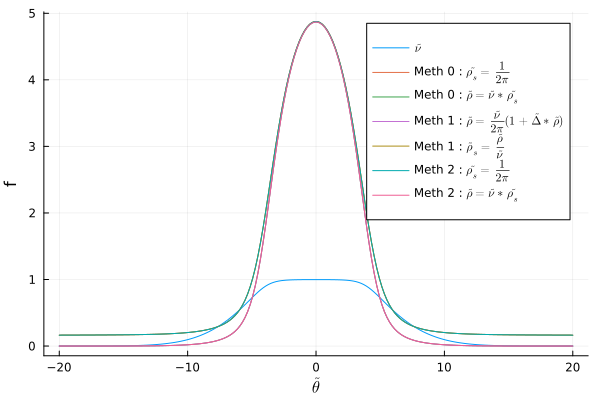

  0.002274 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-18/rho_s_discr_ih1_46.599_200.000.npz
  0.000045 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-18/rho_discr_ih1_46.599_200.000.npz
  0.500707 seconds (15.38 M allocations: 374.007 MiB, 12.24% gc time)
saved : 2024-02-18/theta_edge_1.0_ih1_46.599_200.000.npz
  0.000025 seconds (110 allocations: 5.250 KiB)


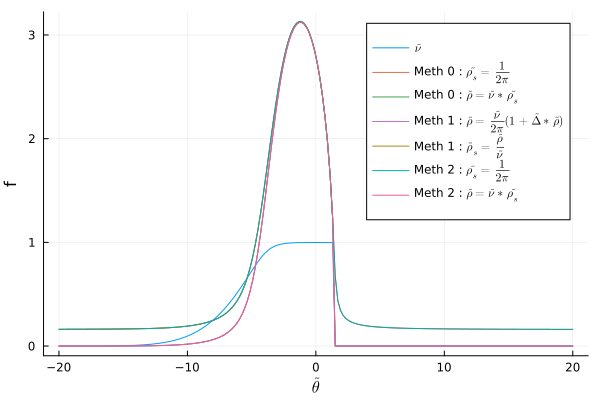

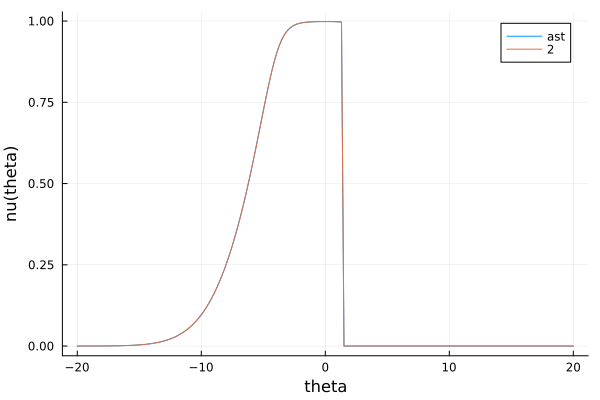

saved : 2024-02-18/nu_theta_edge_1.0_discr_ih1_46.599_200.000.npz
veff (1.468) = 0.000


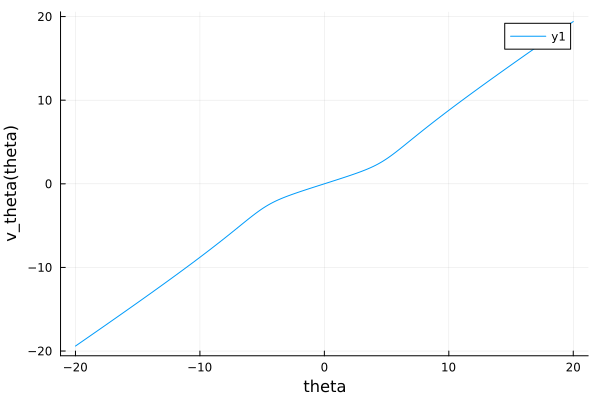

veff (0.302) = -0.856
veff (0.503) = -0.707
veff (0.704) = -0.559
veff (0.905) = -0.412
veff (1.106) = -0.265
veff (1.307) = -0.118
veff (1.508) = 0.029
veff (1.709) = 0.176
veff (1.910) = 0.322
veff (2.111) = 0.468
veff (2.312) = 0.615
veff (2.513) = 0.761
veff (2.714) = 0.908
theta_star = 1.468 


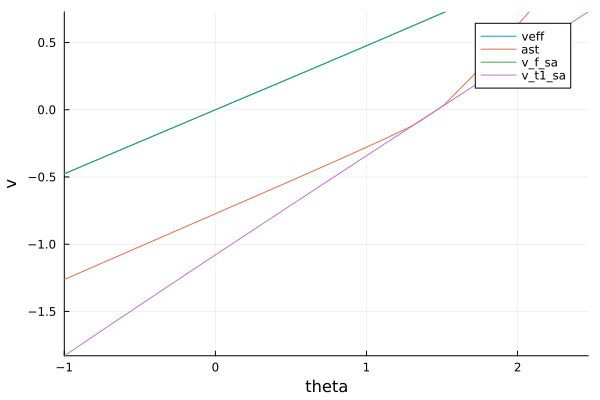

  0.001603 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-18/rho_s_theta_edge_1.0_discr_ih1_46.599_200.000.npz
  0.000009 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-18/rho_theta_edge_1.0_discr_ih1_46.599_200.000.npz


(LinRange{Float64}(-20.0, 20.0, 200), [3.754684683316567e-5, 4.6263328354415815e-5, 5.6883411533285325e-5, 6.979449131281677e-5, 8.545632137711664e-5, 0.00010441312576157557, 0.00012730752559760985, 0.00015489640295474088, 0.0001880689335025451, 0.00022786701818991388  …  0.00022786701818991307, 0.0001880689335025451, 0.00015489640295474088, 0.00012730752559760985, 0.00010441312576157501, 8.545632137711664e-5, 6.979449131281677e-5, 5.6883411533285325e-5, 4.6263328354415815e-5, 3.754684683316567e-5], [0.2241399259676066, 0.22429235598877353, 0.22444918349981577, 0.22461138766029093, 0.22477966104674818, 0.2249544862943137, 0.22513632967774402, 0.2253256854162925, 0.22552309170920615, 0.22572914046657058  …  0.22572914046657044, 0.22552309170920642, 0.22532568541629236, 0.22513632967774394, 0.22495448629431353, 0.22477966104674824, 0.2246113876602908, 0.22444918349981563, 0.22429235598877334, 0.2241399259676067], [8.415747469502817e-6, 1.0376510912494153e-5, 1.2767435273329895e-5, 1.5676

In [266]:
#-------------------------------------------------------------------------------------
#	time evolution for box expansion
#-------------------------------------------------------------------------------------

function evol_edge_expansion(dt, x, gb, theta_tab, n_fun)
    npts_integral = 600
    L = size(x)[1]
    
    veff_tab = zeros(L)

    f = linear_interpolation(x, theta_tab)

    #velocity of first and last points is the one of free particles
    veff_tab[1] = theta_tab[1]

    for j in 2:L
        thet1 = theta_tab[j]
        thet2 = theta_tab[1]
        lam_discr = LinRange(thet2,thet1,npts_integral)
        n_discr = n_fun.(lam_discr)
        veff_tab[j] = last(veff(gb, lam_discr, n_discr))
        #velocities of right contour (using parity symmetry)
    end
    
    return x + dt*veff_tab
end

#-------------------------------------------------------------------------------------
#	box expansion: calculate density (careful: return density in units of rapidities
#    for density in mu^-1 multiply by mass/hbar)
#-------------------------------------------------------------------------------------

function eval_edge_density(x, gb, theta_tab, nu_fun, ratio_m_hbar)
    L = size(x)[1]
    L_t = size(theta_tab)[1]
    dens = zeros(2,L)
    #nu = Vector{Vector{Any}}()
    nu = zeros(L_t,L)
    f = linear_interpolation(x, theta_tab)

    #density of first and last points is zero
    dens[1,1] = x[1]
    dens[2,1] = 0
    thet1 = theta_tab[1]
    #for i in 1:L 
    #    theta = theta_tab[i]
    #    if theta > thet1 
    #        nu[i,1] = 0 
    #    else
    #        nu[i,1] = nu_fun(theta)      
    #    end
    #end

    for j in 2:L
        thet1 = theta_tab[j]
        thet2 = theta_tab[1]
        lam_discr = LinRange(thet2,thet1,600)
        nu_discr = nu_fun.(lam_discr)
        dens[1,j] = x[j]
        dens[2,j] = ratio_m_hbar * charge_density(gb, lam_discr, nu_discr, ones(size(lam_discr)[1]) )
        #for i in 1:L 
        #    theta = theta_tab[i]
         #   if theta > thet1 
         #       nu[i,j] = 0 
         #   else
         #       nu[i,j] = nu_fun(theta)      
         #   end
        #end
    end

    #sort densities according to positions, and return
    return dens[:,sortperm(dens[1, :])] #, nu
end

#------------------------------------------------------------------------------------------------
#	function for simulating box expansion. Writes results in file 'data/density_expansion_t.npd'
#     where 't' is the time (takes a list of times to be saved as argument)
#------------------------------------------------------------------------------------------------
# Paramètres supplémentaires
#new_date = "2024-02-09"
nom = "theta_edge_1.0_ih1"

# Paramètres supplémentaires

theta_discr , nu_discr , rho_s_discr , rho_discr , theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )



  0.000018 seconds (4 allocations: 1.922 KiB)


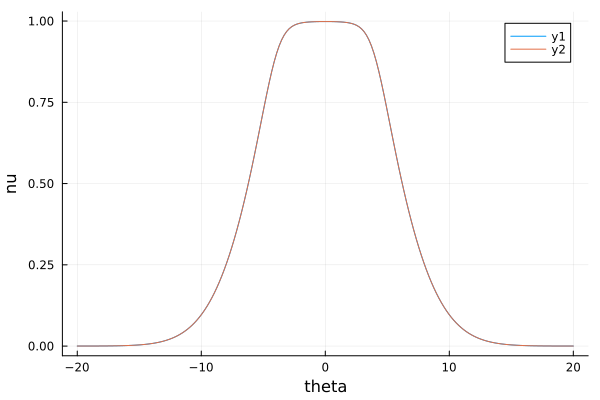

t = 0.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_0.000.npz


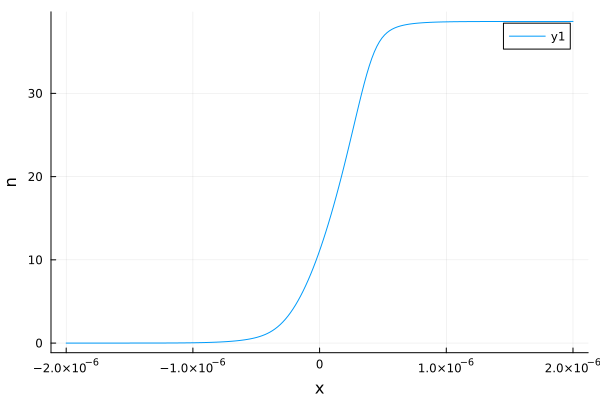

t = 1.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_1.000.npz


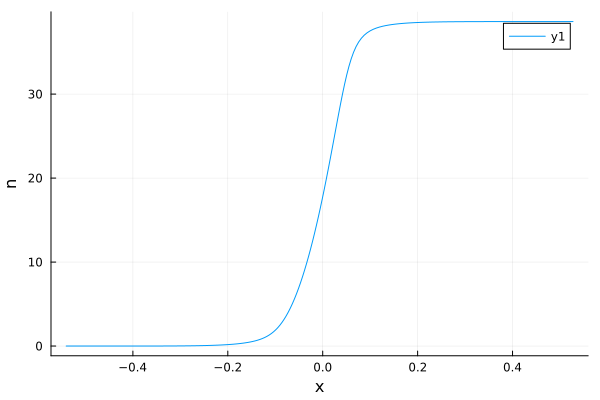

t = 2.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_2.000.npz


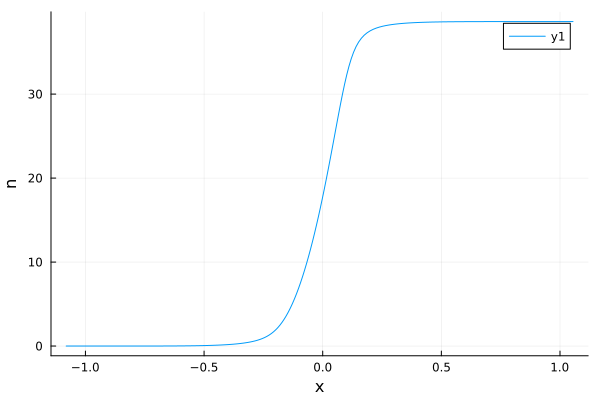

t = 2.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_2.000.npz


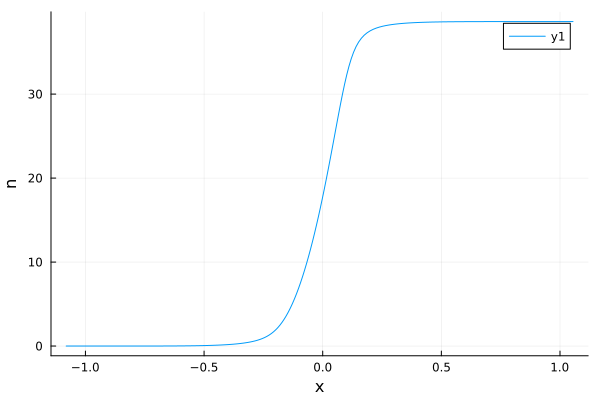

t = 3.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_3.000.npz


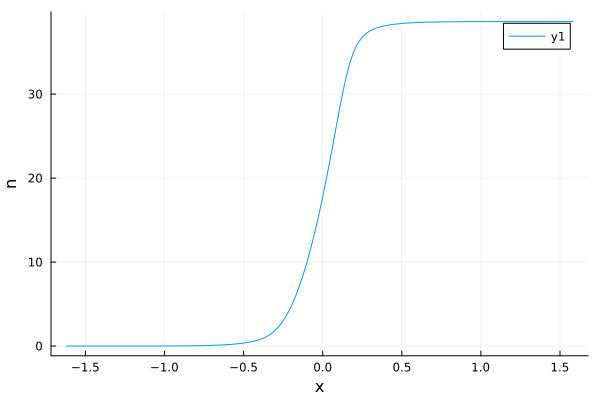

t = 3.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_3.000.npz


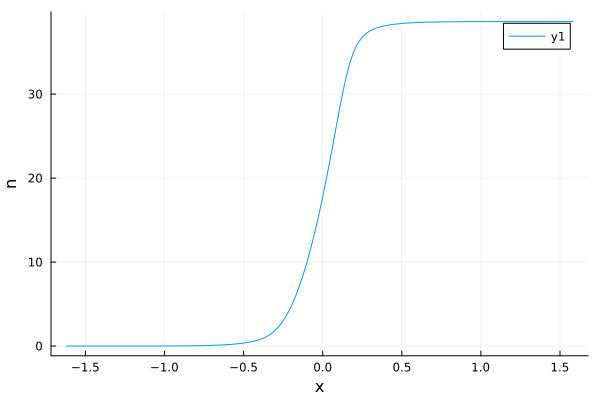

t = 4.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_4.000.npz


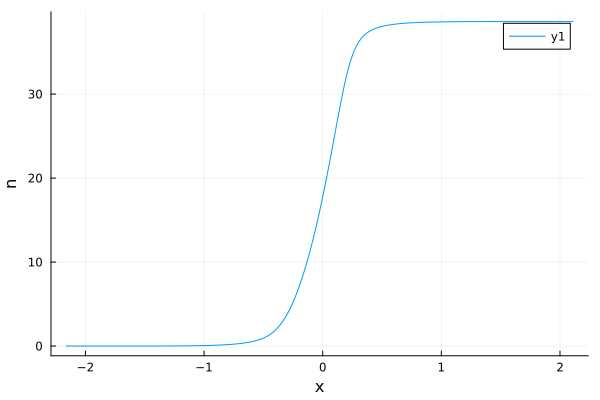

t = 4.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_4.000.npz


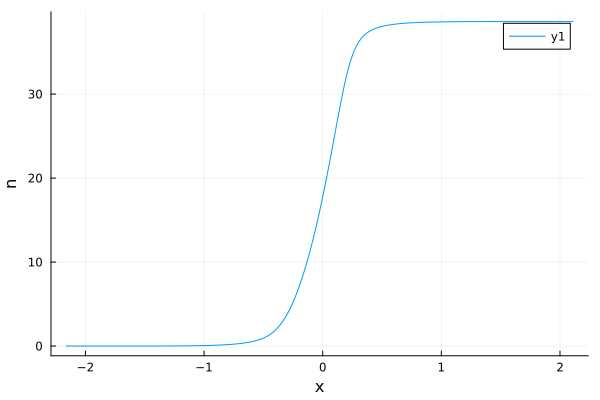

t = 5.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_5.000.npz


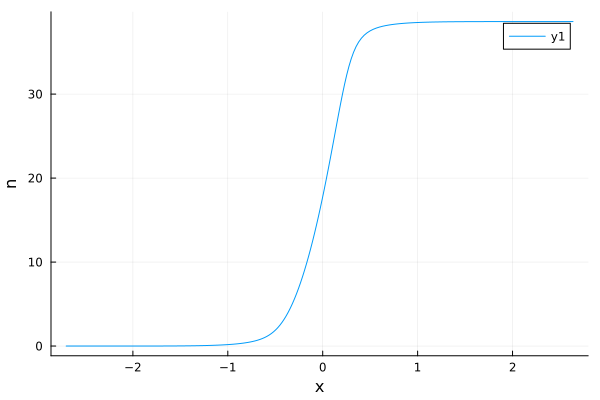

t = 5.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_5.000.npz


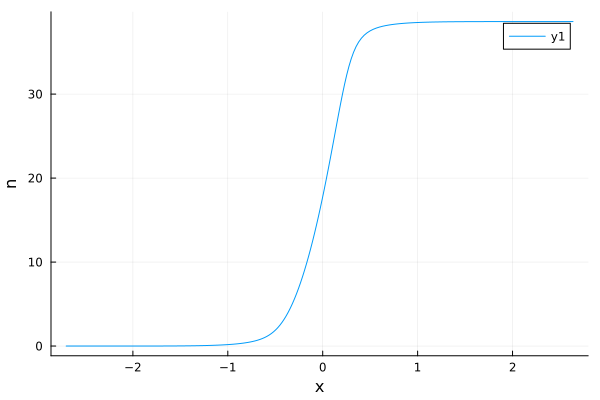

t = 6.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_6.000.npz


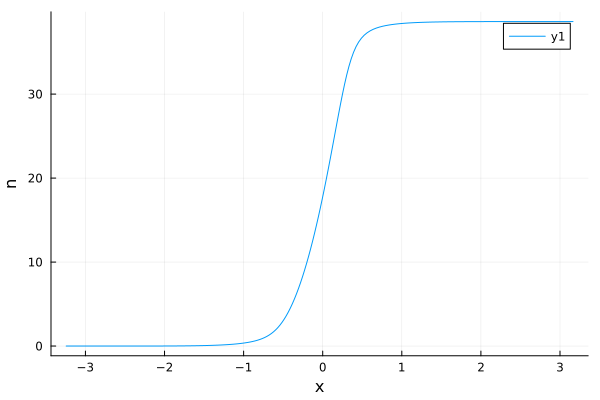

t = 6.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_6.000.npz


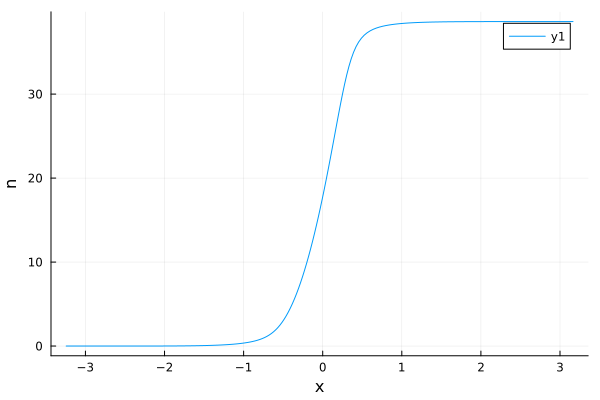

t = 7.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_7.000.npz


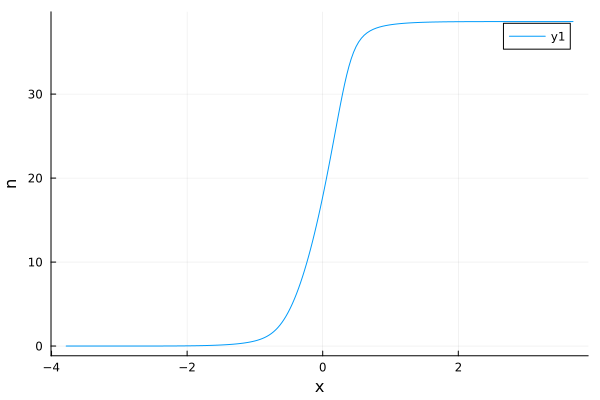

t = 7.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_7.000.npz


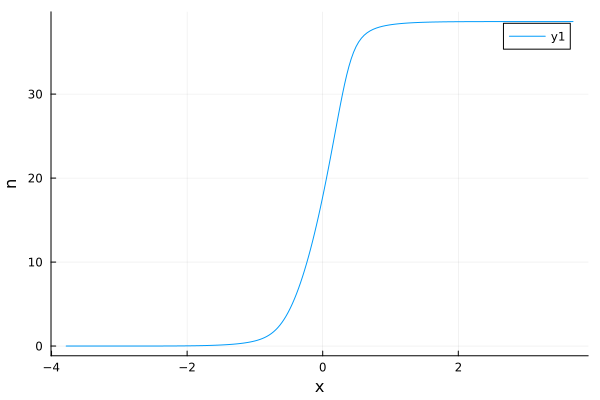

t = 8.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_8.000.npz


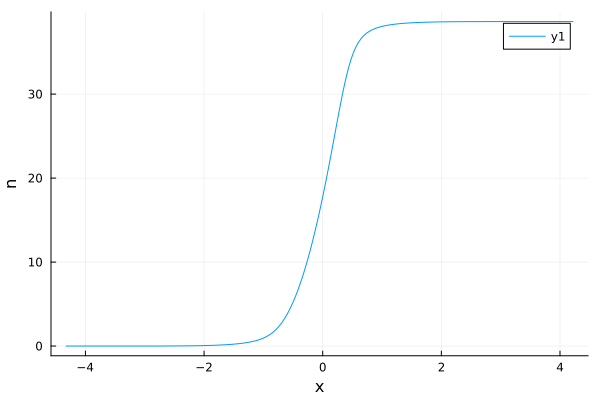

t = 8.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_8.000.npz


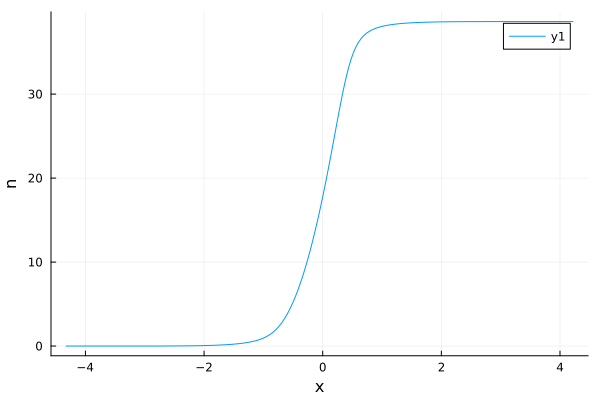

t = 9.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_9.000.npz


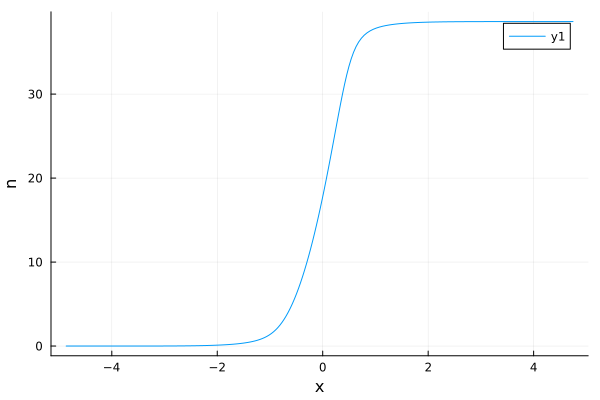

t = 9.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_9.000.npz


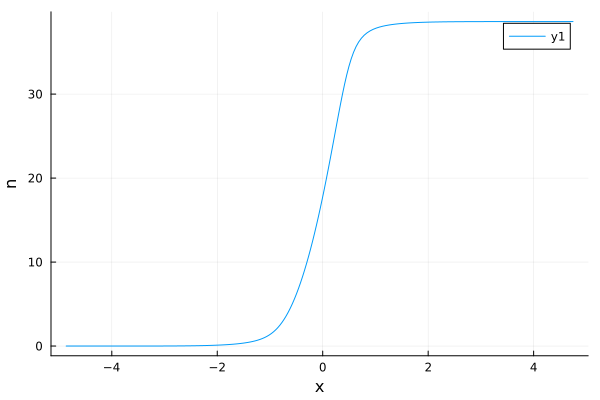

t = 10.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_10.000.npz


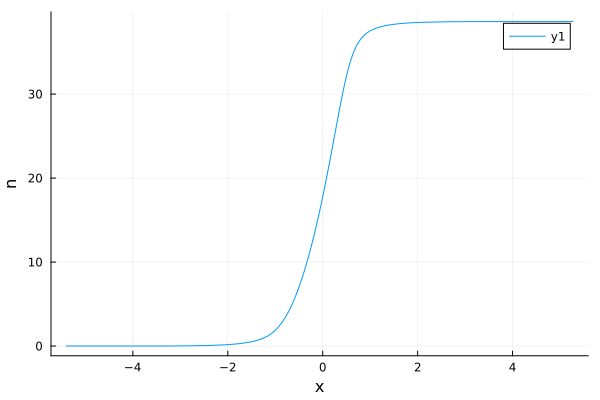

t = 10.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_10.000.npz


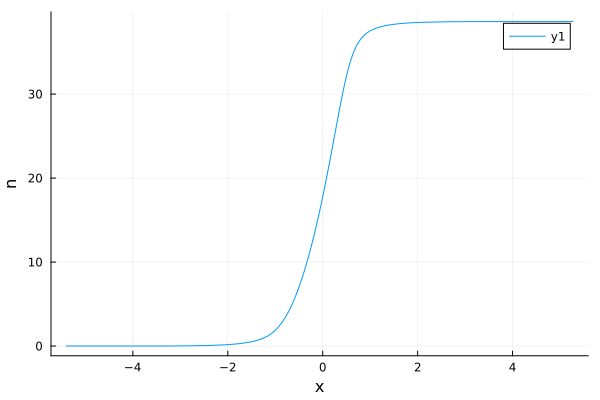

t = 11.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_11.000.npz


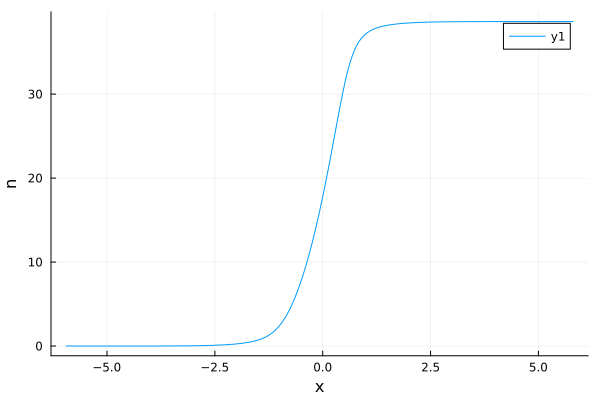

t = 18.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih1_46.599_200.000_37.000_18.000.npz


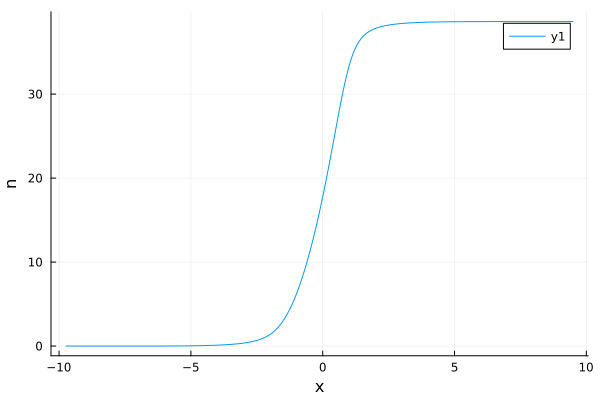

In [267]:

filename0 = @sprintf "%s/density_expansion_nu_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
filename0 = @sprintf "%s/density_expansion_nu_theta_edge_1_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
filename1 = @sprintf "%s/nu_theta_edge_1_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)

filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
filename1 = @sprintf "%s/nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)

function edge_expansion(n_fun, dt, list_t_save, theta_max, npts, gb, ratio_m_hbar)
    tmax = maximum(list_t_save)
    theta_tab = LinRange(-theta_max, theta_max, npts)
    x = 0.0000001*theta_tab
        
    t = 0
    #mydensity ,  nu= eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
    mydensity = eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
    println(@sprintf "t = %.3f saved" t*Taille)
    filename = filename0 * @sprintf("%.3f.npz", Float64(t))
    println("saved : ", filename)
    npzwrite(filename, mydensity)
    
    #filename = filename1 * @sprintf("%.3f.npz", Float64(t*Taille))
    #println("saved : ", filename)
    #println("Taille de nu : ", size(nu))
    #println("Type de nu : ", typeof(nu))

    #nu = map(x -> Float64(x), nu)
    #npzwrite(filename, map(x -> Float64(x), nu))

    p = plot(xlabel="x", ylabel="n", legend=:topright)
    plot!(p, mydensity[1,:],  mydensity[2,:] )
    display(p)
    while t<=tmax
        x = evol_edge_expansion(dt, x , gb, theta_tab, n_fun)
        t += dt
        
        for ts in list_t_save
            if t-dt<=ts && ts<=t
                #mydensity , nu= eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
                mydensity = eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
                println(@sprintf "t = %.3f saved" t*Taille)
                filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                println("saved : ", filename)
                npzwrite(filename, mydensity)
                
                p = plot(xlabel="x", ylabel="n", legend=:topright)
                plot!(p, mydensity[1,:],  mydensity[2,:] )
                display(p)
                    
                #filename = filename1 * @sprintf("%.3f.npz", Float64(t*Taille))
                #println("saved : ", filename)
                #npzwrite(filename, map(x -> Float64(x), nu))
                    
            end
        end
    end
end

# Créer l'interpolation
@time nu_fun = LinearInterpolation(theta_discr, nu_discr)

# Afficher l'interpolation
p = plot(xlabel="theta", ylabel="nu", legend=:topright)
plot!(p, theta_discr,  nu_discr )
plot!(p, theta_discr, nu_fun(theta_discr))
display(p)

temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille ]
temps_sav = [ 0.1/Taille, 0.5/Taille, 1/Taille, 5/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 18.0/Taille]
temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 18/Taille  ]

dt = 1.0/Taille
edge_expansion(nu_fun, dt ,temps_sav  , theta_max , npts , gbar, mass/hbar)


## Coupure de taile $\ell$ + evolution

(200,)


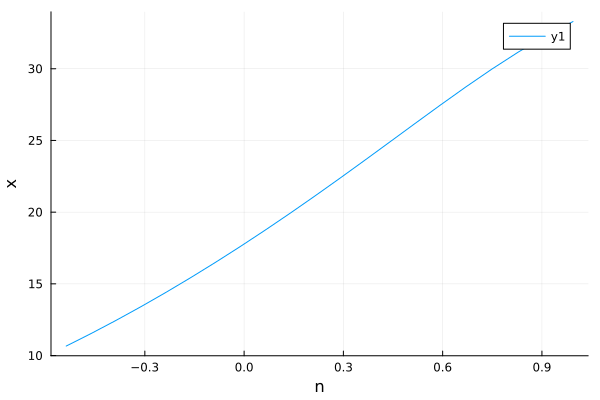

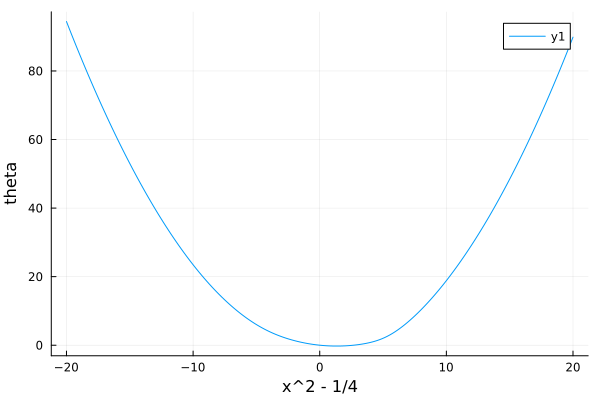

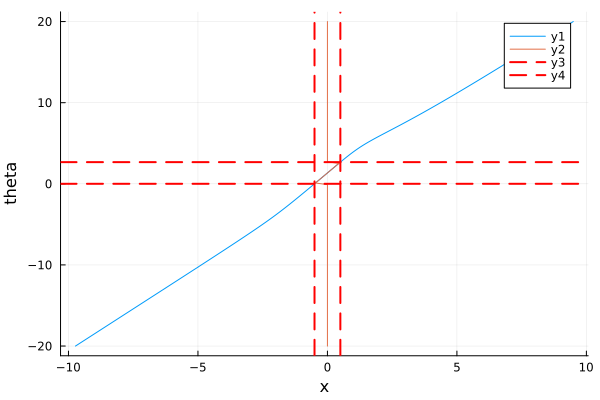

ih2
saved : 2024-02-18/theta_discr_ih2_46.599_200.000_37.000_18.000.npz
saved : 2024-02-18/x_ih2_46.599_200.000_37.000_18.000.npz.npz


┌ Warning: Duplicated knots were deduplicated. Use Interpolations.deduplicate_knots!(knots) explicitly to avoid this warning.
│   k1 =
│    400-element Vector{Float64}:
│     -20.0
│     -19.899478624965532
│     -19.798957249931064
│     -19.6984358748966
│     -19.597914499862128
│       ⋮
│       2.615385102641592
│       2.6287780845430406
│       2.642171066444489
│       2.6555640483459375
│       2.668957030247386
└ @ Interpolations ~/.julia/packages/Interpolations/u7CND/src/gridded/gridded.jl:77


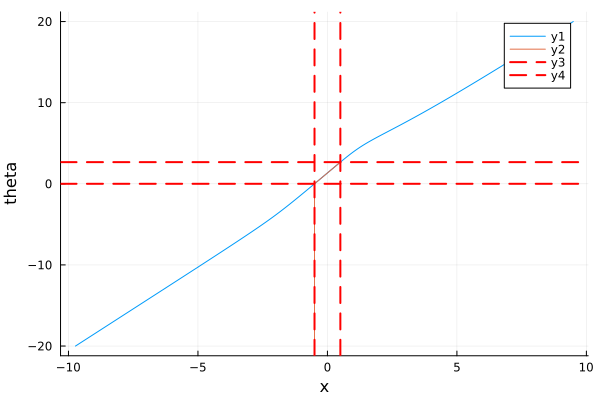

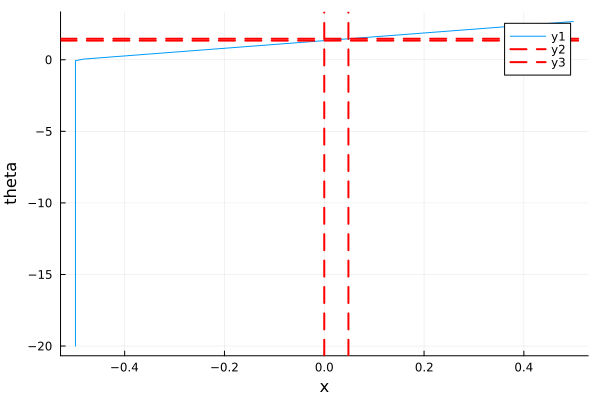

saved : 2024-02-18/theta_discr_ih2.npz
  0.008303 seconds (2.53 k allocations: 4.666 MiB)
size : 200
saved : 2024-02-18/nu_discr_ih2_46.599_200.000.npz


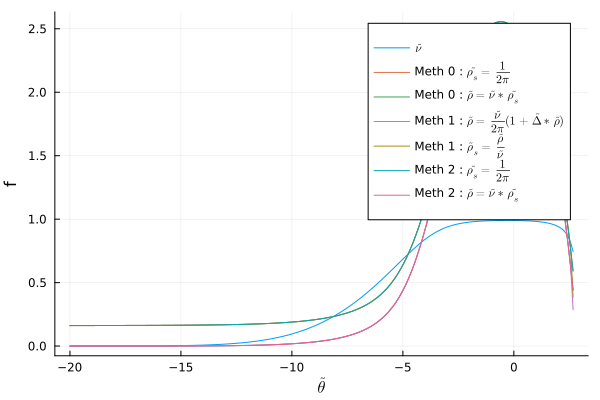

  0.002247 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-18/rho_s_discr_ih2_46.599_200.000.npz
  0.000023 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-18/rho_discr_ih2_46.599_200.000.npz
  0.513392 seconds (15.39 M allocations: 374.157 MiB, 15.19% gc time)
saved : 2024-02-18/theta_edge_1.0_ih2_46.599_200.000.npz
  0.000020 seconds (189 allocations: 6.484 KiB)


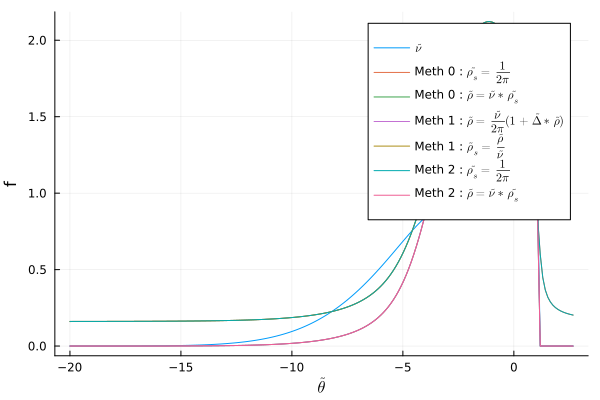

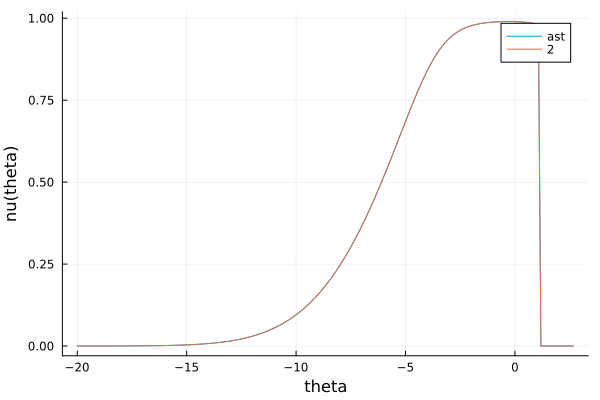

saved : 2024-02-18/nu_theta_edge_1.0_discr_ih2_46.599_200.000.npz
veff (1.133) = 0.000


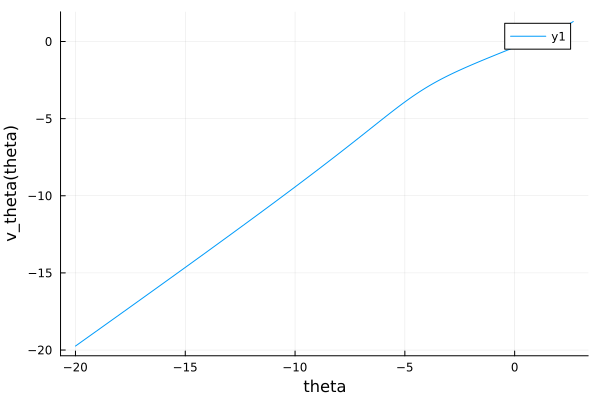

veff (-0.065) = -0.952
veff (0.049) = -0.862
veff (0.163) = -0.772
veff (0.277) = -0.681
veff (0.391) = -0.591
veff (0.505) = -0.500
veff (0.618) = -0.410
veff (0.732) = -0.319
veff (0.846) = -0.229
veff (0.960) = -0.138
veff (1.074) = -0.047
veff (1.188) = 0.044
veff (1.302) = 0.135
veff (1.416) = 0.227
veff (1.530) = 0.319
veff (1.644) = 0.412
veff (1.758) = 0.505
veff (1.872) = 0.598
veff (1.985) = 0.693
veff (2.099) = 0.789
veff (2.213) = 0.886
veff (2.327) = 0.984
theta_star = 1.133 


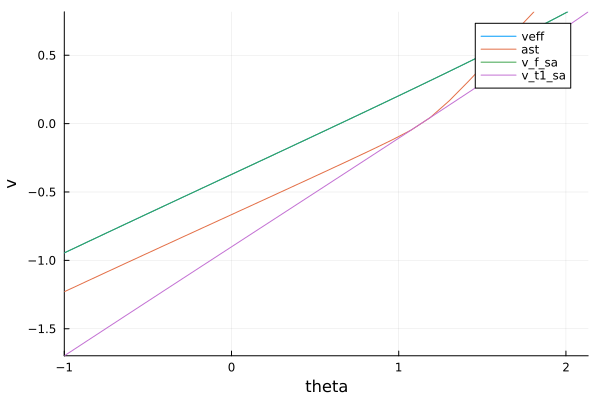

  0.001592 seconds (21 allocations: 1.840 MiB)
saved : 2024-02-18/rho_s_theta_edge_1.0_discr_ih2_46.599_200.000.npz
  0.000013 seconds (3 allocations: 1.828 KiB)
saved : 2024-02-18/rho_theta_edge_1.0_discr_ih2_46.599_200.000.npz


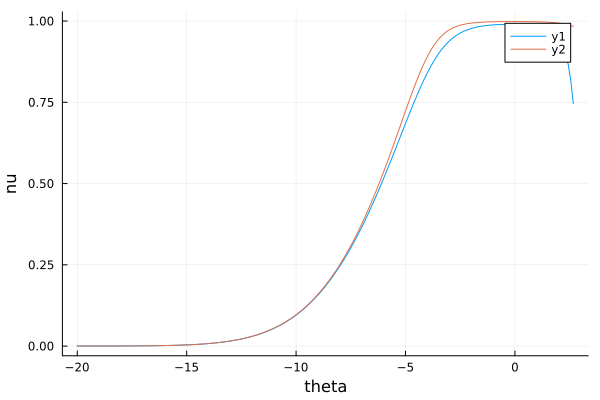

t = 0.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_0.000.npz


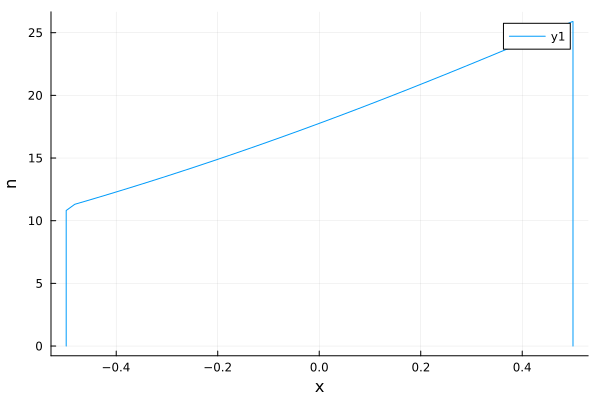

t = 0.000 
t = 1.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_1.000.npz


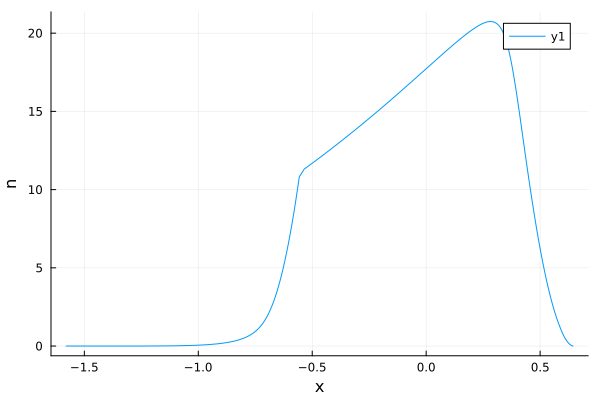

t = 2.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_2.000.npz


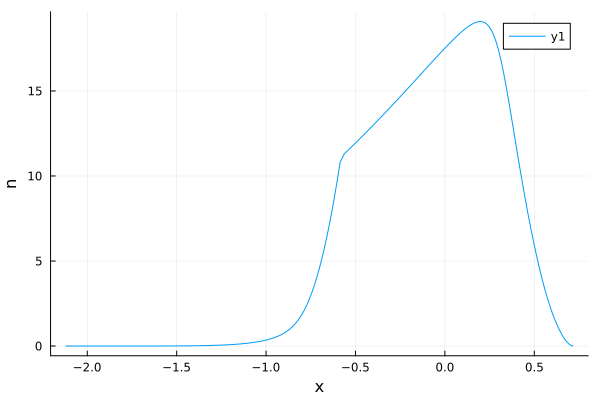

t = 2.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_2.000.npz


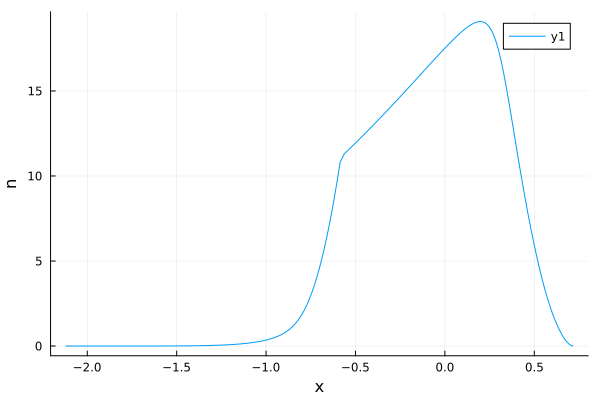

t = 3.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_3.000.npz


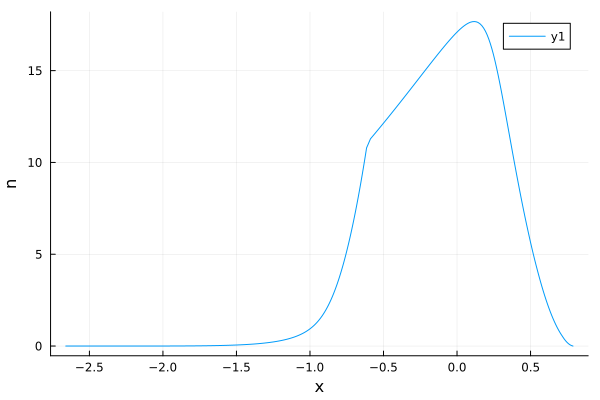

t = 3.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_3.000.npz


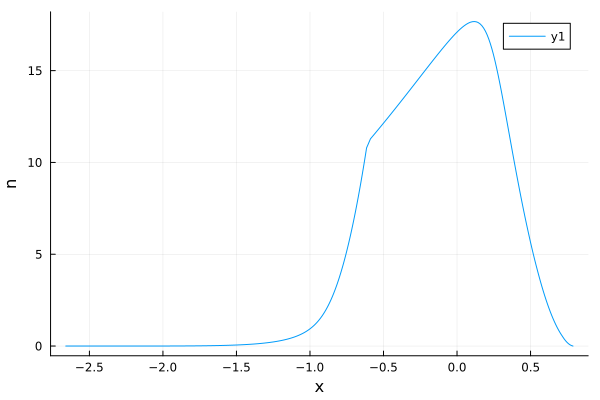

t = 4.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_4.000.npz


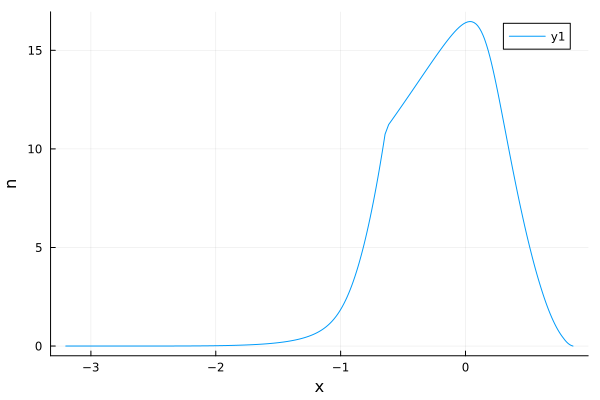

t = 4.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_4.000.npz


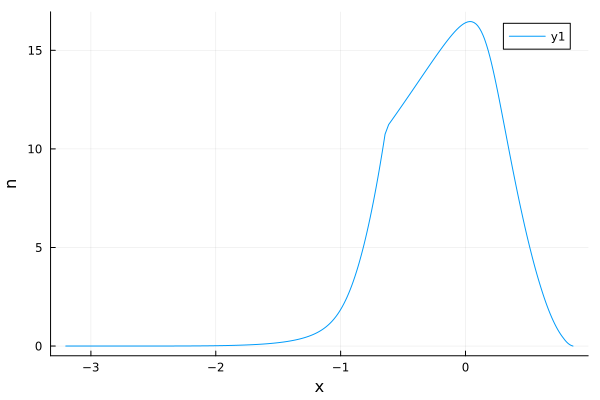

t = 5.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_5.000.npz


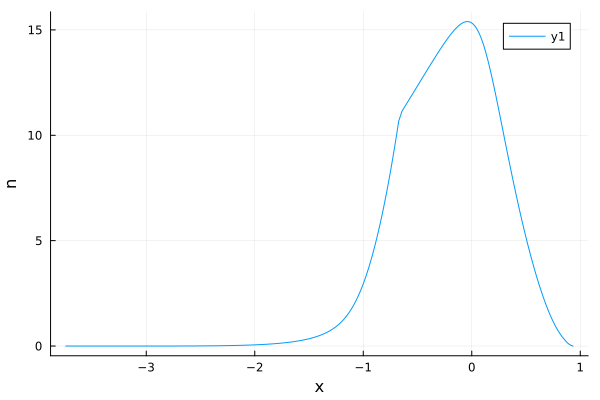

t = 5.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_5.000.npz


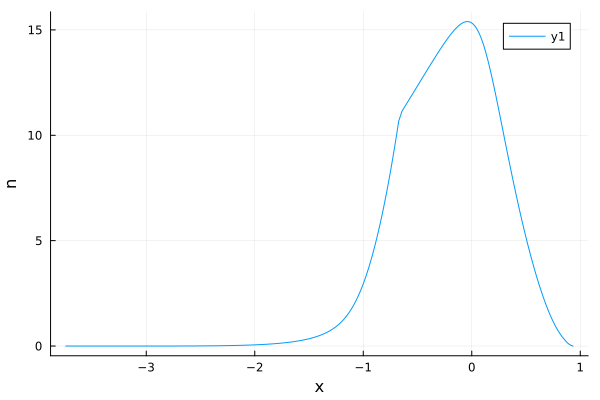

t = 6.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_6.000.npz


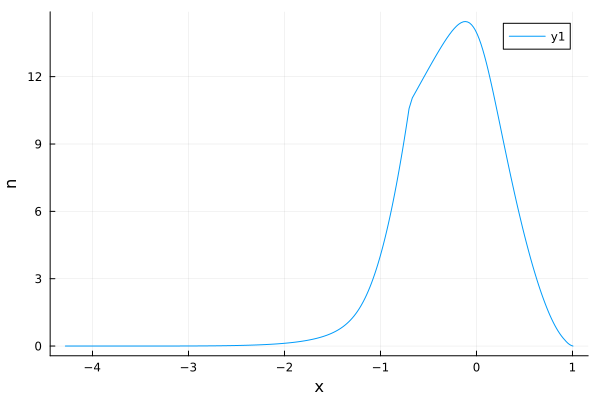

t = 6.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_6.000.npz


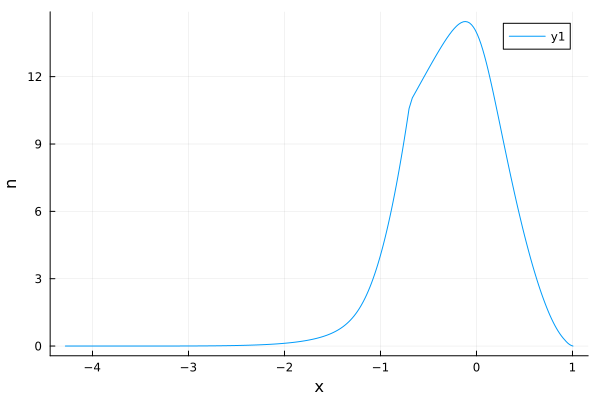

t = 7.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_7.000.npz


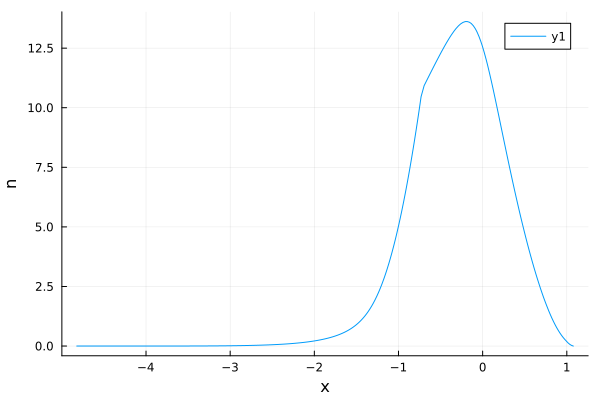

t = 7.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_7.000.npz


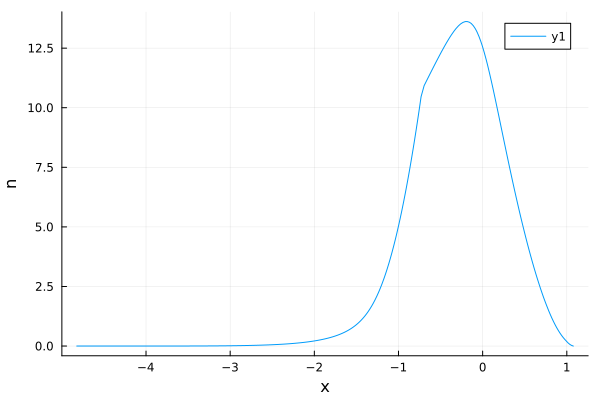

t = 8.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_8.000.npz


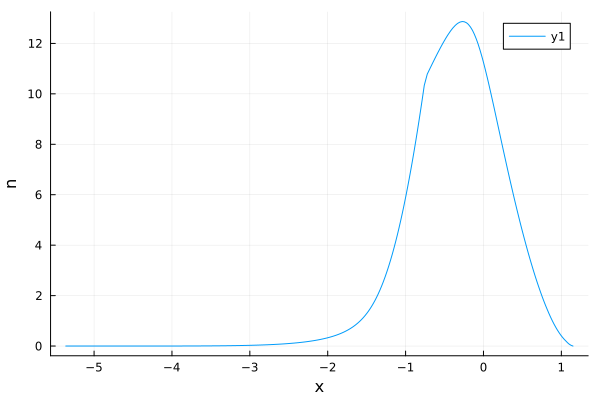

t = 8.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_8.000.npz


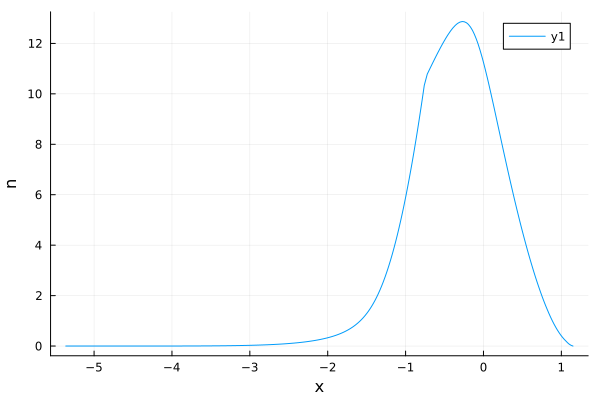

t = 9.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_9.000.npz


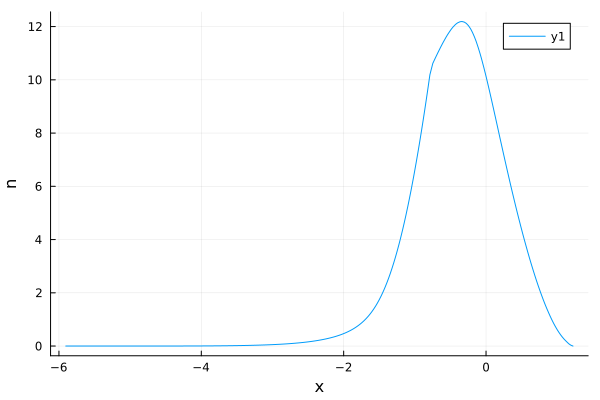

t = 9.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_9.000.npz


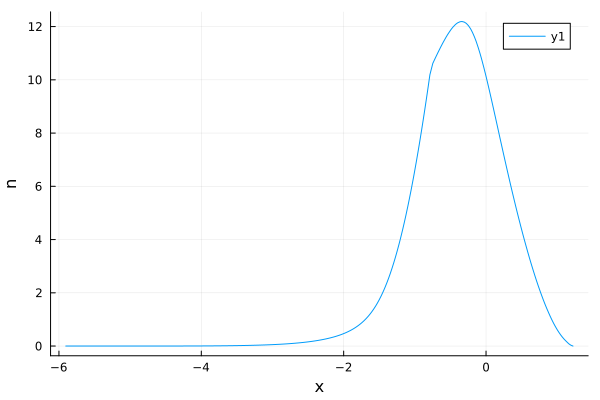

t = 10.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_10.000.npz


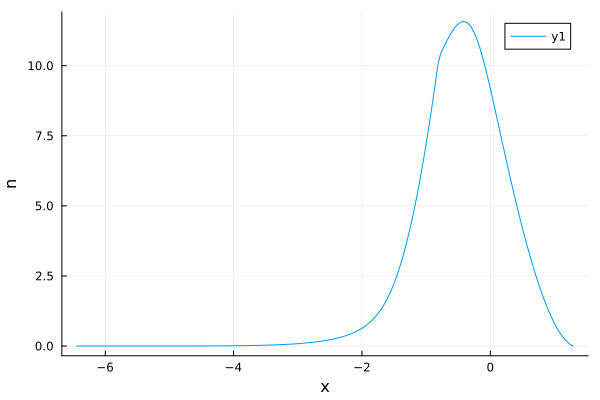

t = 10.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_10.000.npz


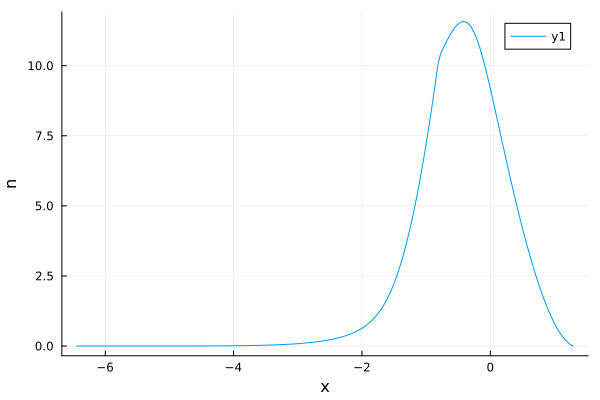

t = 11.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_11.000.npz


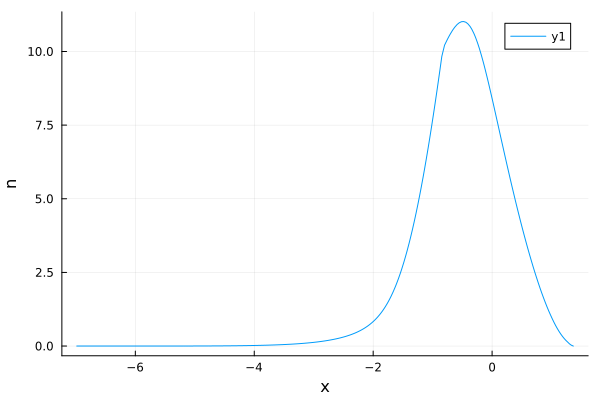

t = 20.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_20.000.npz


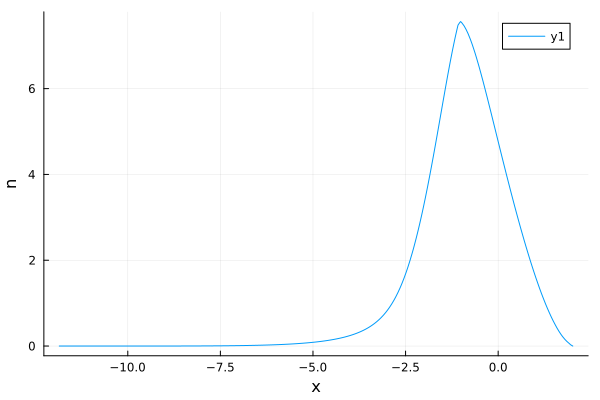

t = 21.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_21.000.npz


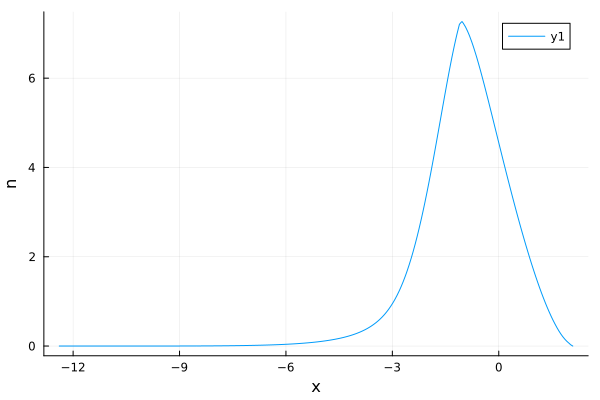

t = 31.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_31.000.npz


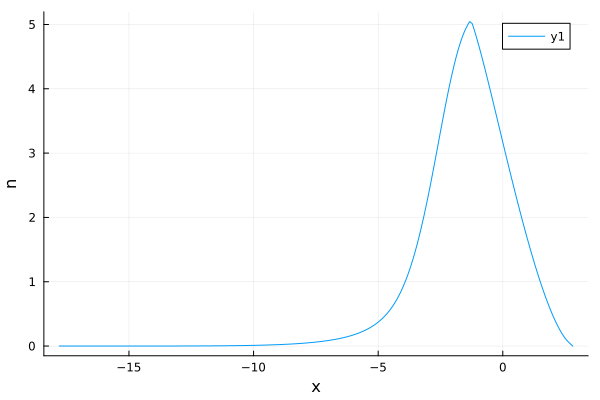

t = 41.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_41.000.npz


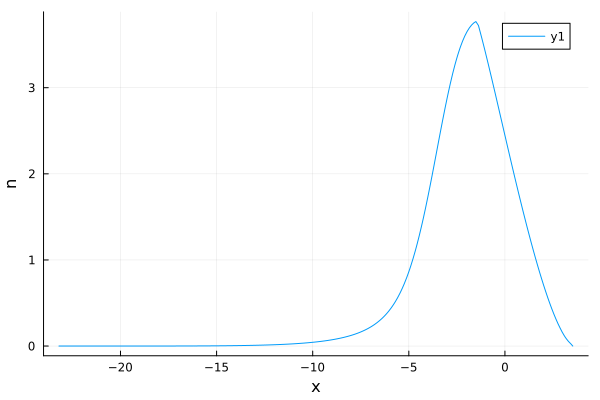

t = 51.000 saved
saved : 2024-02-18/density_expansion_nu_theta_edge_1.0_ih2_46.599_200.000_37.000_51.000.npz


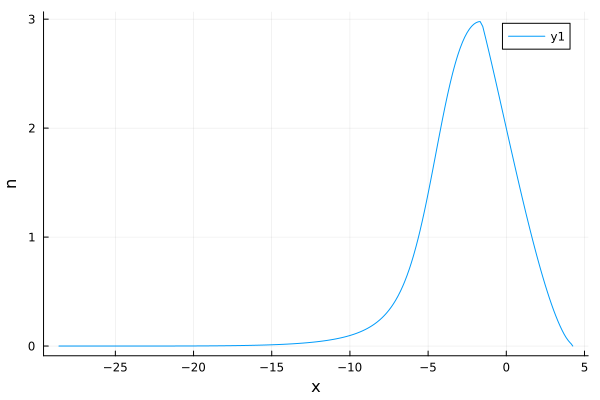

In [268]:
using NPZ
using Printf


# on prend le bord au dernier temps (18.05 ms)
nom = "theta_edge_1.0_ih1"
t = 18.0/Taille
filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
#filename = @sprintf "%s/density_expansion_nu_edge_julia_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
density = npzread(filename)


# on coupe où (x/\ell)^2 > 1/4 
x = density[1,:]
println( size(x))
y = density[2,:]
g , d  = 110 - 10 , 110+10
p = plot(ylabel="x", xlabel="n", legend=:topright)
plot!(p,  x[g:d] , y[g:d])
display(p)
x_fun = LinearInterpolation(theta_discr,x)
theta_fun = LinearInterpolation(x, theta_discr)
x_squared = x .^ 2
x_squared_fun = LinearInterpolation(theta_discr, x_squared)

f = LinearInterpolation(theta_discr, x_squared)
f = theta -> linear_interpolation(theta_discr, x_squared.-1/4)(theta)
p = plot(ylabel="theta", xlabel="x^2 - 1/4", legend=:topright)
plot!(p,  theta_discr , f(theta_discr))
display(p)
theta_1 = fzero(f, theta_discr[1] , theta_fun(0))
theta_2 = fzero(f, theta_fun(0) , last(theta_discr))

x2 = ifelse.(x_squared .> 1/4, 0, x)

p = plot(ylabel="theta", xlabel="x", legend=:topright)
plot!(p,  x , theta_discr)
plot!(p,  x2 , theta_discr)
vline!(p, [x_fun(theta_1), x_fun(theta_2)], linestyle=:dash, color=:red, linewidth=2)
hline!(p, [theta_1, theta_2], linestyle=:dash, color=:red, linewidth=2)
display(p)

#npts = 200
theta_discr_2 = LinRange(theta_1, theta_2 , npts)
max_abs_theta = maximum(abs.(theta_discr_2))
max_abs_theta = maximum([20 , max_abs_theta])
theta_discr_gauche = LinRange(-max_abs_theta, theta_1 , npts)
theta_discr_2 = cat(theta_discr_gauche, theta_discr_2, dims=1)

nom = "theta_edge_1.0_ih2"
index_last_underscore = findlast(isequal('_'), nom)
println(nom[index_last_underscore+1:end])

## bord gauche 
x_2 = cat(x_fun(theta_1) * ones(size(theta_discr_gauche)[1]) , LinRange(x_fun(theta_1), x_fun(theta_2) , npts) , dims = 1 )
x_2_fun = LinearInterpolation(theta_discr_2, x_2)
theta_discr_2 = LinRange(theta_discr_2[1], last(theta_discr_2) , npts)
x_2 = x_2_fun(theta_discr_2)
filename = @sprintf "%s/theta_discr_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
npzwrite(filename, theta_discr_2 )
println("saved : ", filename)
filename = @sprintf "%s/x_%s_%.3f_%.3f_%.3f_%.3f.npz.npz" new_date nom[index_last_underscore+1:end] Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
npzwrite(filename, x_2 )
println("saved : ", filename)



p = plot(ylabel="theta", xlabel="x", legend=:topright)
plot!(p,  x , theta_discr)
plot!(p,  x_2 , theta_discr_2)
vline!(p, [x_fun(theta_1), x_fun(theta_2)], linestyle=:dash, color=:red, linewidth=2)
hline!(p, [theta_1, theta_2], linestyle=:dash, color=:red, linewidth=2)
display(p)

p = plot(ylabel="theta", xlabel="x", legend=:topright)
plot!(p,  x_2 , theta_discr_2)
vline!(p, [0 , x_fun(theta_star)], linestyle=:dash, color=:red, linewidth=2)
hline!(p, [theta_fun(0) , theta_star], linestyle=:dash, color=:red, linewidth=2)
display(p)

#save_nu_rho_rho_s(new_date , nom , theta_discr_2, n_p , mup , T , Taille , gbar )
theta_discr , nu_discr , rho_s_discr , rho_discr , theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = save_nu_rho_rho_s(new_date , nom , theta_discr_2, n_p , mup ,  T , Taille , gbar )


#println( mup )
filename0 = @sprintf "%s/density_expansion_nu_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
filename0 = @sprintf "%s/density_expansion_nu_theta_edge_2_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)


function box_expansion(n_fun,theta_tab, x, dt, list_t_save,  npts, gb, ratio_m_hbar)
    tmax = maximum(list_t_save)
    x1 = x + 0.0000001*theta_tab
    x2 = 0.5 * ones(npts) + 0.0000001*theta_tab

    t = 0

    mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
    println(@sprintf "t = %.3f saved" t*Taille)
    filename = filename0 * @sprintf("%.3f.npz", Float64(t))
    println("saved : ", filename)
    npzwrite(filename, mydensity)

    p = plot(xlabel="x", ylabel="n", legend=:topright)
    plot!(p, mydensity[1,:],  mydensity[2,:] )
    display(p)
    
    println(@sprintf "t = %.3f " t*Taille)
    while t<=tmax + dt 
        x1, x2 = evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
        
        #println(@sprintf "t = %.3f " t*Taille)

        for ts in list_t_save
            if t-dt<=ts && ts<=t
                mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
                println(@sprintf "t = %.3f saved" t*Taille)
                filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                println("saved : ", filename)
                npzwrite(filename, mydensity)
                p = plot(xlabel="x", ylabel="n", legend=:topright)
                plot!(p, mydensity[1,:],  mydensity[2,:] )
                display(p)
            end
        end
        t += dt
    end
end

p = plot(xlabel="theta", ylabel="nu", legend=:topright)
plot!(p, theta_discr,  nu_discr )
plot!(p, theta_discr, nu_fun(theta_discr))
display(p)

temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille ,51.0/Taille ]
temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
dt = 1/Taille
box_expansion(nu_fun, theta_discr_2 , x_2 , dt ,temps_sav  , npts , gbar, mass/hbar)


# finale en boucle 

In [ ]:
liste_mup = LinRange(30,40, 5)*kB
liste_T = LinRange(90, 150, 3)
#liste_T = [100]
#for n_p in liste_n_p
#for n_p in liste_n_p
for mup in liste_mup
    for T in liste_T
        
        ##text = "Homehène 50 ms"
        ##@printf("%89s\n", center(text, 89, '='))
        
        #new_date = "2024-02-09"
        nom = "theta_star_1.0_h"

        # Paramètres supplémentaires

        #mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
        #mup = 49*kB #kg um^2.ms^-1
        #n_p = (((mup / (hbar * om_perp)) + 1)^2 - 1) / (4 * a3D)
        #Nat = 700
        #Taille = Nat/n_p    # Taille de la boîte (microns)

        # ou on fixe Taille
        #Taille = 42 #mu m 
        #n_p = Nat/Taille
        println(n_p)

        #n_p = 45                     # um^{-1}
        #T = 100                # nK
        #Taille = 37.    # Taille de la boîte (microns)
        #mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
        #mup = g * n_p   #kg um^2.ms^-1


        theta_max = 20
        npts = 200
        theta_discr = LinRange(-theta_max, theta_max , npts) 

        #------------------------------------------------------------------------------------------------
        #	Fonction pour calculer les nu , rho et rho_s et predire cest fonction apres la coupure 1 
        #-
        function save_nu_rho_rho_s(new_date , nom , theta_discr, n_p  , mup , T , Taille , gbar )
            if mup == "None" 
               mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
            else 
                n_p = (((mup / (hbar * om_perp)) + 1)^2 - 1) / (4 * a3D)
            end
            # Discrétisation de theta
            beta = [-mup / (kB * T) 0 mass * g^2/(kB * T * hbar^2)]
            beta = [-mup / (kB * T) 0 mass /(kB * T)]

            # Définir la date sous forme de chaîne

            index_last_underscore = findlast(isequal('_'), nom)


            filename = @sprintf "%s/theta_discr_%s.npz" new_date nom[index_last_underscore+1:end]
            npzwrite(filename, theta_discr )
            println("saved : ", filename)  

            @time nu_discr = yangyang(gbar, beta, theta_discr)
            println("size : ", size(nu_discr)[1])
            filename = @sprintf "%s/nu_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
            npzwrite(filename, nu_discr )
            println("saved : ", filename)
            montrer_les_rho(theta_discr , nu_discr)

            @time rho_s_discr = 0.5 / pi * mass/hbar*dress(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]))
            filename = @sprintf "%s/rho_s_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
            npzwrite(filename, rho_s_discr )
            println("saved : ", filename)

            @time rho_discr = nu_discr .* rho_s_discr
            filename = @sprintf "%s/rho_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
            npzwrite(filename, rho_discr )
            println("saved : ", filename)

            @time theta_star = find_theta_star(theta_discr, nu_discr ,gbar)
            filename = @sprintf "%s/%s_%.3f_%.3f.npz" new_date nom mup/kB T
            npzwrite(filename, theta_star )
            println("saved : ", filename)

            @time nu_theta_star_discr = find_nu_theta_star_discr(theta_discr , theta_star  , nu_discr )
            filename = @sprintf "%s/nu_%s_discr_%s_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T
            montrer_les_rho(theta_discr , nu_theta_star_discr)
            p = plot(xlabel="theta", ylabel="nu(theta)", legend=:topright)
            plot!(p, theta_discr,  nu_theta_star_discr , label = "ast")
            nu_theta_star_discr = Float64.(nu_theta_star_discr)
            plot!(p, theta_discr,  nu_theta_star_discr , label = "2")
            display(p)
            npzwrite(filename, nu_theta_star_discr )
            println("saved : ", filename)

            f_veff_star_theta_star = theta_star -> linear_interpolation(theta_discr, veff( gbar, theta_discr, ifelse.(theta_discr .> theta_star, 0, nu_discr)))(theta_star)
            println( @sprintf "veff (%.3f) = %.3f" theta_star f_veff_star_theta_star(theta_star))
            p = plot(xlabel="theta", ylabel="v_theta(theta)", legend=:topright)
            plot!(p, theta_discr,  f_veff_star_theta_star(theta_discr) )
            display(p)

            function f_veff_star_theta_star_2(theta_star, theta_discr, veff, gbar, nu_discr)
                #nu_theta_star_discr = find_nu_theta_star_discr(theta_discr, theta_star, nu_discr)
                nu_theta_star_discr_ast = ifelse.(theta_discr .> theta_star, 0, nu_discr)
                v_eff = veff(gbar, theta_discr, nu_theta_star_discr_ast)
                interpolation = LinearInterpolation(theta_discr, v_eff)
                return interpolation(theta_star)
            end

            # Calculer f_veff_star_theta_star pour chaque élément de theta_star
            #f_veff_star_theta_star_vector = [f_veff_star_theta_star_2(theta_star, theta_discr, veff, gbar, nu_discr) for theta_star in theta_star]
            #display(f_veff_star_theta_star_vector)
            f_veff_star_theta_star_vector_1 = zeros(npts)
            f_veff_star_theta_star_vector_2 = zeros(npts)
            for i = 1:npts
                f_veff_star_theta_star_vector_1[i] = f_veff_star_theta_star(theta_discr[i])
                f_veff_star_theta_star_vector_2[i] = f_veff_star_theta_star_2(theta_discr[i], theta_discr, veff, gbar, nu_discr)
            end
            # Affichage des résultats
            for (theta_star_value, f_value) in zip(theta_discr, f_veff_star_theta_star_vector_2)
                if abs.(f_value)<1 
                    println(@sprintf "veff (%.3f) = %.3f" theta_star_value f_value)
                end
            end

            # Tracé de la fonction f_veff_star_theta_star
            #p = plot(xlabel="theta", ylabel="v_theta(theta)", legend=:topright)
            #plot!(p, theta_discr, f_veff_star_theta_star_vector)
            #display(p)

            theta_star = fzero(f_veff_star_theta_star, theta_star-1 , theta_star+1)
            println(@sprintf "theta_star = %.3f " theta_star)

            p = plot(xlabel="theta", ylabel="v", legend=:topright)
            #plot!(p, theta_discr,  nu_discr  ,label = "nu" )
            #plot!(p, theta_discr,  nu_theta_star_discr , label = " nu ast")
            plot!(p, theta_discr,  veff(gbar , theta_discr, nu_discr ) ,label = "veff" )
            plot!(p, theta_discr,  veff(gbar , theta_discr, nu_theta_star_discr) , label = "ast")
            #plot!(p, theta_discr,  veff(gbar , theta_discr, nu_discr )-veff(gbar , theta_discr, nu_theta_star_discr) , label = "ast")
            plot!(p, theta_discr,   f_veff_star_theta_star(theta_discr) , label = "v_f_sa")
            plot!(p, theta_discr,   f_veff_star_theta_star_vector_1 , label = "v_t1_sa")
            #plot!(p, theta_discr,   f_veff_star_theta_star_vector_2 , label = "v_t2_sa") 
            #vline!(p, [theta_star], linestyle=:dash, color=:red, linewidth=2)
            #hline!(p, [f_veff_star_theta_star(theta_star)], linestyle=:dash, color=:red, linewidth=2)
            xlims!(p, -1 , theta_star+1 )
            ylims!(p, f_veff_star_theta_star(-1) , f_veff_star_theta_star(theta_star+1) )
            display(p)

            @time rho_s_theta_star_discr = 0.5 / pi * mass/hbar * dress(gbar, theta_discr, nu_theta_star_discr, ones(size(theta_discr)[1]))
            filename = @sprintf "%s/rho_s_%s_discr_%s_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T
            npzwrite(filename, rho_s_theta_star_discr )
            println("saved : ", filename)

            @time rho_theta_star_discr = nu_theta_star_discr .* rho_s_theta_star_discr
            filename = @sprintf "%s/rho_%s_discr_%s_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T
            npzwrite(filename, rho_theta_star_discr )
            println("saved : ", filename)

            return theta_discr , nu_discr , rho_s_discr , rho_discr , theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr

        end 

        theta_discr , nu_discr , rho_s_discr , rho_discr , theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )

        #------------------------------------------------------------------------------------------------
        #	function for simulating box expansion. Writes results in file 'data/density_expansion_t.npd'
        #     where 't' is the time (takes a list of times to be saved as argument)
        #------------------------------------------------------------------------------------------------
        filename0 = @sprintf "%s/density_expansion_nu_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)

        function box_expansion(n_fun, dt, list_t_save, theta_max, npts, gb, ratio_m_hbar)
            tmax = maximum(list_t_save)
            theta_tab = LinRange(-theta_max, theta_max, npts)
            x1 = -0.5 * ones(npts) + 0.0000001*theta_tab
            x2 = 0.5 * ones(npts) + 0.0000001*theta_tab

            t = 0

            mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
            println(@sprintf "t = %.3f saved" t*Taille)
            filename = filename0 * @sprintf("%.3f.npz", Float64(t))
            println("saved : ", filename)
            npzwrite(filename, mydensity)

            p = plot(xlabel="x", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)
            while t<=tmax
                x1, x2 = evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
                t += dt

                for ts in list_t_save
                    if t-dt<=ts && ts<=t
                        mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
                        println(@sprintf "t = %.3f saved" t*Taille)
                        filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                        println("saved : ", filename)
                        npzwrite(filename, mydensity)

                        p = plot(xlabel="x", ylabel="n", legend=:topright)
                        plot!(p, mydensity[1,:],  mydensity[2,:] )
                        display(p)
                    end
                end
            end
        end

        using Interpolations

        # Créer l'interpolation
        @time nu_fun = LinearInterpolation(theta_discr, nu_discr)
        @time nu_fun = LinearInterpolation(theta_discr, nu_theta_star_discr)

        # Afficher l'interpolation
        p = plot(xlabel="theta", ylabel="nu", legend=:topright)
        plot!(p, theta_discr,  nu_discr )
        plot!(p, theta_discr, nu_fun(theta_discr))
        display(p)

        temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille ]
        temps_sav = [ 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille, 50.0/Taille ]
        dt = 0.9/Taille
        temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
        temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
        dt = 1/Taille
        box_expansion(nu_fun, dt ,temps_sav  , theta_max , npts , gbar, mass/hbar)

        
        ##text = "InHomehène"
        ##@printf("%89s\n", center(text, 89, '='))
        
        #text = "Evolution d'un bord 18 ms"
        #@printf("%89s\n", center(text, 89, '-'))
        
        #-------------------------------------------------------------------------------------
        #	time evolution for box expansion
        #-------------------------------------------------------------------------------------

        function evol_edge_expansion(dt, x, gb, theta_tab, n_fun)
            npts_integral = 600
            L = size(x)[1]

            veff_tab = zeros(L)

            f = linear_interpolation(x, theta_tab)

            #velocity of first and last points is the one of free particles
            veff_tab[1] = theta_tab[1]

            for j in 2:L
                thet1 = theta_tab[j]
                thet2 = theta_tab[1]
                lam_discr = LinRange(thet2,thet1,npts_integral)
                n_discr = n_fun.(lam_discr)
                veff_tab[j] = last(veff(gb, lam_discr, n_discr))
                #velocities of right contour (using parity symmetry)
            end

            return x + dt*veff_tab
        end

        #-------------------------------------------------------------------------------------
        #	box expansion: calculate density (careful: return density in units of rapidities
        #    for density in mu^-1 multiply by mass/hbar)
        #-------------------------------------------------------------------------------------

        function eval_edge_density(x, gb, theta_tab, nu_fun, ratio_m_hbar)
            L = size(x)[1]
            L_t = size(theta_tab)[1]
            dens = zeros(2,L)
            #nu = Vector{Vector{Any}}()
            nu = zeros(L_t,L)
            f = linear_interpolation(x, theta_tab)

            #density of first and last points is zero
            dens[1,1] = x[1]
            dens[2,1] = 0
            thet1 = theta_tab[1]
            #for i in 1:L 
            #    theta = theta_tab[i]
            #    if theta > thet1 
            #        nu[i,1] = 0 
            #    else
            #        nu[i,1] = nu_fun(theta)      
            #    end
            #end

            for j in 2:L
                thet1 = theta_tab[j]
                thet2 = theta_tab[1]
                lam_discr = LinRange(thet2,thet1,600)
                nu_discr = nu_fun.(lam_discr)
                dens[1,j] = x[j]
                dens[2,j] = ratio_m_hbar * charge_density(gb, lam_discr, nu_discr, ones(size(lam_discr)[1]) )
                #for i in 1:L 
                #    theta = theta_tab[i]
                 #   if theta > thet1 
                 #       nu[i,j] = 0 
                 #   else
                 #       nu[i,j] = nu_fun(theta)      
                 #   end
                #end
            end

            #sort densities according to positions, and return
            return dens[:,sortperm(dens[1, :])] #, nu
        end

        #------------------------------------------------------------------------------------------------
        #	function for simulating box expansion. Writes results in file 'data/density_expansion_t.npd'
        #     where 't' is the time (takes a list of times to be saved as argument)
        #------------------------------------------------------------------------------------------------
        # Paramètres supplémentaires
        #new_date = "2024-02-09"
        nom = "theta_edge_1.0_ih1"

        # Paramètres supplémentaires

        theta_discr , nu_discr , rho_s_discr , rho_discr , theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )
        
        
        filename0 = @sprintf "%s/density_expansion_nu_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
        filename0 = @sprintf "%s/density_expansion_nu_theta_edge_1_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
        filename1 = @sprintf "%s/nu_theta_edge_1_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)

        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
        filename1 = @sprintf "%s/nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)

        function edge_expansion(n_fun, dt, list_t_save, theta_max, npts, gb, ratio_m_hbar)
            tmax = maximum(list_t_save)
            theta_tab = LinRange(-theta_max, theta_max, npts)
            x = 0.0000001*theta_tab

            t = 0
            #mydensity ,  nu= eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
            mydensity = eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
            println(@sprintf "t = %.3f saved" t*Taille)
            filename = filename0 * @sprintf("%.3f.npz", Float64(t))
            println("saved : ", filename)
            npzwrite(filename, mydensity)

            #filename = filename1 * @sprintf("%.3f.npz", Float64(t*Taille))
            #println("saved : ", filename)
            #println("Taille de nu : ", size(nu))
            #println("Type de nu : ", typeof(nu))

            #nu = map(x -> Float64(x), nu)
            #npzwrite(filename, map(x -> Float64(x), nu))

            p = plot(xlabel="x", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)
            while t<=tmax
                x = evol_edge_expansion(dt, x , gb, theta_tab, n_fun)
                t += dt

                for ts in list_t_save
                    if t-dt<=ts && ts<=t
                        #mydensity , nu= eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
                        mydensity = eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
                        println(@sprintf "t = %.3f saved" t*Taille)
                        filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                        println("saved : ", filename)
                        npzwrite(filename, mydensity)

                        p = plot(xlabel="x", ylabel="n", legend=:topright)
                        plot!(p, mydensity[1,:],  mydensity[2,:] )
                        display(p)

                        #filename = filename1 * @sprintf("%.3f.npz", Float64(t*Taille))
                        #println("saved : ", filename)
                        #npzwrite(filename, map(x -> Float64(x), nu))

                    end
                end
            end
        end

        # Créer l'interpolation
        @time nu_fun = LinearInterpolation(theta_discr, nu_discr)

        # Afficher l'interpolation
        p = plot(xlabel="theta", ylabel="nu", legend=:topright)
        plot!(p, theta_discr,  nu_discr )
        plot!(p, theta_discr, nu_fun(theta_discr))
        display(p)

        temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille ]
        temps_sav = [ 0.1/Taille, 0.5/Taille, 1/Taille, 5/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 18.0/Taille]
        temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 18/Taille  ]

        dt = 1/Taille
        edge_expansion(nu_fun, dt ,temps_sav  , theta_max , npts , gbar, mass/hbar)

        
        #text = "Coupure taille + Evolution 50ms "
        #@printf("%89s\n", center(text, 89, '-'))
        
        using NPZ
        using Printf


        # on prend le bord au dernier temps (18.05 ms)
        nom = "theta_edge_1.0_ih1"
        t = 18.0/Taille
        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
        filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
        #filename = @sprintf "%s/density_expansion_nu_edge_julia_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
        density = npzread(filename)


        # on coupe où (x/\ell)^2 > 1/4 
        x = density[1,:]
        println( size(x))
        y = density[2,:]
        g , d  = 110 - 10 , 110+10
        p = plot(ylabel="x", xlabel="n", legend=:topright)
        plot!(p,  x[g:d] , y[g:d])
        display(p)
        x_fun = LinearInterpolation(theta_discr,x)
        theta_fun = LinearInterpolation(x, theta_discr)
        x_squared = x .^ 2
        x_squared_fun = LinearInterpolation(theta_discr, x_squared)

        f = LinearInterpolation(theta_discr, x_squared)
        f = theta -> linear_interpolation(theta_discr, x_squared.-1/4)(theta)
        p = plot(ylabel="theta", xlabel="x^2 - 1/4", legend=:topright)
        plot!(p,  theta_discr , f(theta_discr))
        display(p)
        theta_1 = fzero(f, theta_discr[1] , theta_fun(0))
        theta_2 = fzero(f, theta_fun(0) , last(theta_discr))

        x2 = ifelse.(x_squared .> 1/4, 0, x)

        p = plot(ylabel="theta", xlabel="x", legend=:topright)
        plot!(p,  x , theta_discr)
        plot!(p,  x2 , theta_discr)
        vline!(p, [x_fun(theta_1), x_fun(theta_2)], linestyle=:dash, color=:red, linewidth=2)
        hline!(p, [theta_1, theta_2], linestyle=:dash, color=:red, linewidth=2)
        display(p)

        #npts = 200
        theta_discr_2 = LinRange(theta_1, theta_2 , npts)
        max_abs_theta = maximum(abs.(theta_discr_2))
        max_abs_theta = maximum([20 , max_abs_theta])
        theta_discr_gauche = LinRange(-max_abs_theta, theta_1 , npts)
        theta_discr_2 = cat(theta_discr_gauche, theta_discr_2, dims=1)

        nom = "theta_edge_1.0_ih2"
        index_last_underscore = findlast(isequal('_'), nom)
        println(nom[index_last_underscore+1:end])

        ## bord gauche 
        x_2 = cat(x_fun(theta_1) * ones(size(theta_discr_gauche)[1]) , LinRange(x_fun(theta_1), x_fun(theta_2) , npts) , dims = 1 )
        x_2_fun = LinearInterpolation(theta_discr_2, x_2)
        theta_discr_2 = LinRange(theta_discr_2[1], last(theta_discr_2) , npts)
        x_2 = x_2_fun(theta_discr_2)
        filename = @sprintf "%s/theta_discr_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
        npzwrite(filename, theta_discr_2 )
        println("saved : ", filename)
        filename = @sprintf "%s/x_%s_%.3f_%.3f_%.3f_%.3f.npz.npz" new_date nom[index_last_underscore+1:end] Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
        npzwrite(filename, x_2 )
        println("saved : ", filename)



        p = plot(ylabel="theta", xlabel="x", legend=:topright)
        plot!(p,  x , theta_discr)
        plot!(p,  x_2 , theta_discr_2)
        vline!(p, [x_fun(theta_1), x_fun(theta_2)], linestyle=:dash, color=:red, linewidth=2)
        hline!(p, [theta_1, theta_2], linestyle=:dash, color=:red, linewidth=2)
        display(p)

        p = plot(ylabel="theta", xlabel="x", legend=:topright)
        plot!(p,  x_2 , theta_discr_2)
        vline!(p, [0 , x_fun(theta_star)], linestyle=:dash, color=:red, linewidth=2)
        hline!(p, [theta_fun(0) , theta_star], linestyle=:dash, color=:red, linewidth=2)
        display(p)

        #save_nu_rho_rho_s(new_date , nom , theta_discr_2, n_p , mup , T , Taille , gbar )
        theta_discr , nu_discr , rho_s_discr , rho_discr , theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = save_nu_rho_rho_s(new_date , nom , theta_discr_2, n_p , mup ,  T , Taille , gbar )


        #println( mup )
        filename0 = @sprintf "%s/density_expansion_nu_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
        filename0 = @sprintf "%s/density_expansion_nu_theta_edge_2_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)


        function box_expansion(n_fun,theta_tab, x, dt, list_t_save,  npts, gb, ratio_m_hbar)
            tmax = maximum(list_t_save)
            x1 = x + 0.0000001*theta_tab
            x2 = 0.5 * ones(npts) + 0.0000001*theta_tab

            t = 0

            mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
            println(@sprintf "t = %.3f saved" t*Taille)
            filename = filename0 * @sprintf("%.3f.npz", Float64(t))
            println("saved : ", filename)
            npzwrite(filename, mydensity)

            p = plot(xlabel="x", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)

            println(@sprintf "t = %.3f " t*Taille)
            while t<=tmax
                x1, x2 = evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)

                #println(@sprintf "t = %.3f " t*Taille)

                for ts in list_t_save
                    if t-dt<=ts && ts<=t
                        mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
                        println(@sprintf "t = %.3f saved" t*Taille)
                        filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                        println("saved : ", filename)
                        npzwrite(filename, mydensity)
                        p = plot(xlabel="x", ylabel="n", legend=:topright)
                        plot!(p, mydensity[1,:],  mydensity[2,:] )
                        display(p)
                    end
                end
                t += dt
            end
        end

        p = plot(xlabel="theta", ylabel="nu", legend=:topright)
        plot!(p, theta_discr,  nu_discr )
        plot!(p, theta_discr, nu_fun(theta_discr))
        display(p)

        temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
        temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
        dt = 1/Taille
        box_expansion(nu_fun, theta_discr_2 , x_2 , dt ,temps_sav  , npts , gbar, mass/hbar)

    end
end


In [159]:
function center_text(text::AbstractString, width::Int, fillchar::Char)
    space = width - length(text)
    left_space = space ÷ 2
    right_space = space - left_space
    return fill(fillchar, left_space) * text * fill(fillchar, right_space)
end

text = "jj"
width = 89
fillchar = '='

centered_text = center_text(text, width, fillchar)
println(centered_text)


LoadError: MethodError: no method matching *(::Vector{Char}, ::String)

[0mClosest candidates are:
[0m  *(::Any, ::Any, [91m::Any[39m, [91m::Any...[39m)
[0m[90m   @[39m [90mBase[39m [90m[4moperators.jl:578[24m[39m
[0m  *([91m::Union{AbstractChar, AbstractString}[39m, ::Union{AbstractChar, AbstractString}...)
[0m[90m   @[39m [90mBase[39m [90mstrings/[39m[90m[4mbasic.jl:260[24m[39m
[0m  *(::StridedVecOrMat, [91m::Adjoint{<:Any, <:LinearAlgebra.LQPackedQ}[39m)
[0m[90m   @[39m [35mLinearAlgebra[39m [90m~/julia-1.9.3/share/julia/stdlib/v1.9/LinearAlgebra/src/[39m[90m[4mlq.jl:269[24m[39m
[0m  ...


In [72]:
using NPZ
using Printf

new_date = "test"

T = 100.000  # Exemple de valeur pour T
Taille = 40.000  # Exemple de valeur pour Taille
t_times_Taille = 18.050  # Exemple de valeur pour t*Taille

# Calculer mup_kb avec une valeur par défaut si mup est nothing
mup_kb = 48.881 

# Charger theta_discr_julia à partir du fichier
filename_theta_discr = @sprintf("%s/theta_discr_julia.npz", new_date)
theta_discr_julia = npzread(filename_theta_discr)

# Charger density à partir du fichier
filename_density = @sprintf("%s/density_expansion_nu_edge_julia_%.3f_%.3f_%.3f_%.3f.npz", new_date, mup_kb, T, Taille, t_times_Taille)
density = npzread(filename_density)


2×200 Matrix{Float64}:
 -9.025  -8.9343      -8.84359      …   8.60436   8.69746   8.79058
  0.0     7.8997e-11   1.98611e-10     41.5218   41.5304   41.5249

In [60]:
using Glob
using Printf
import Base.Iterators: product

function extract_triples(date::String, nom::String, mup::Union{Nothing, Float64}=nothing, T::Union{Nothing, Float64}=nothing, Taille::Union{Nothing, Float64}=nothing)
    triples = Set{Tuple{Float64, Float64, Float64}}()  # Utiliser un ensemble pour éviter les doublons
    
    # Parcourir les fichiers dans le répertoire spécifié par date
    for filename in readdir(joinpath(date))
        # Vérifier si le nom du fichier correspond au format attendu
        m = match(r"density_expansion_nu_$(nom)_([\d.]+)_([\d.]+)_([\d.]+)_([\d.]+)\.npz", filename)
        if m !== nothing
            file_mup = parse(Float64, m.captures[1])
            file_T = parse(Float64, m.captures[2])
            file_Taille = parse(Float64, m.captures[3])
            # Vérifier si les valeurs correspondent aux critères spécifiés
            if (isnothing(mup) || mup == file_mup) && (isnothing(T) || T == file_T) && (isnothing(Taille) || Taille == file_Taille)
                push!(triples, (file_mup, file_T, file_Taille))
            end
        end
    end
    
    return triples
end

function extract_t_times_Taille(date::String, nom::String, triple::Tuple{Float64, Float64, Float64})
    mup, T, Taille = triple
    t_times_Taille_values = Set{Float64}()  # Utiliser un ensemble pour éviter les doublons
    
    # Construire le motif de recherche pour le nom de fichier
    pattern = r"density_expansion_nu_$(nom)_$(mup)_$(T)_$(Taille)_([\d.]+)\.npz"
    
    # Parcourir les fichiers dans le répertoire spécifié par date
    for filename in readdir(joinpath(date))
        # Vérifier si le nom du fichier correspond au format attendu
        m = match(pattern, filename)
        if m !== nothing
            t_times_Taille = parse(Float64, m.captures[1])
            push!(t_times_Taille_values, t_times_Taille)
        end
    end
    
    return t_times_Taille_values
end

date = "2024-02-11"
nom = "theta_star_julia"
mup = nothing
T = nothing
Taille = 42.480

# Extraction des triples possibles
triples = extract_triples(date, nom, mup, T, Taille)
println("Triples possibles:", triples)

for triple in triples
    t_times_Taille_values = extract_t_times_Taille(date, nom, triple)
    println("Temps t*Taille possibles:", t_times_Taille_values)
end


Triples possibles:Set{Tuple{Float64, Float64, Float64}}()


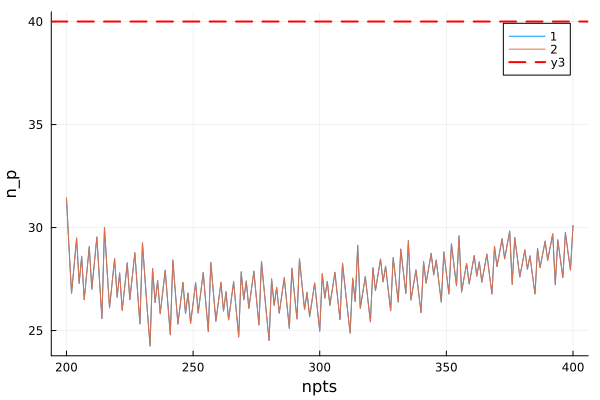

In [43]:
using Plots
using QuadGK

function integrale( x , y )
# Données discrètes
#x = theta_discr
#y = rho_discr

    # Interpolation des données
    f_interp = LinearInterpolation(x, y)

    # Définir la fonction à intégrer
    function f(x)
        return f_interp(x)
    end

    # Intégration sur un intervalle fini
    integral_value, _ = quadgk(f, minimum(x), maximum(x))

    # Afficher le résultat
    #println("Valeur de l'intégrale sur l'intervalle fini: ", integral_value)
    #p1 = plot(xlabel="npts", ylabel="n_p", legend=:topright)
    # Tracer x par rapport à y
    #plot!(p1 , x, y, xlabel="x", ylabel="y", label="y", seriestype=:scatter)

    # Tracer x par rapport à f(x)
    x_values = range(minimum(x), maximum(x), length=100)
    #plot!(p1, x_values, f_interp(x_values), label="f(x)")
    #display(p1) 
    return integral_value
end

#n_p = 40
#T = 0.1
#liste_npts = LinRange(30, 40, 5)
liste_npts = collect(200:400)
theta_max = 20
n_p_1 = zeros(length(liste_npts))
n_p_2 = zeros(length(liste_npts))

for (i, npts) in enumerate(liste_npts)
    theta_discr = LinRange(-theta_max, theta_max, npts)
    mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
    beta = [-mup / (kB * T) 0 mass / (kB * T)]
    nu_discr = yangyang(gbar, beta, theta_discr)
    rho_s_discr = 0.5 / pi * mass / hbar * dress(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]))
    rho_discr = nu_discr .* rho_s_discr
    test_1 = mass / hbar * charge_density(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]))
    #println(test_1)
    n_p_1[i] = test_1
    n_p_2[i] = integrale(theta_discr, rho_discr)
end

p = plot(xlabel="npts", ylabel="n_p", legend=:topright)
plot!(p, liste_npts, n_p_1, label="1")
plot!(p, liste_npts, n_p_2, label="2")
# Ajouter une ligne horizontale pour n_p
hline!(p, [n_p], linestyle=:dash, color=:red, linewidth=2)
display(p)    
    
    

In [16]:
# Définir un tableau (matrice)
A = [1 2 3 4;
     4 5 6 4;
     7 8 9 4]

# Obtenir la transposée de A en utilisant la fonction transpose()
A_transpose = transpose(A)

# Ou, obtenir la transposée de A en utilisant l'opérateur de transposition '
#A_transpose = A'

# Afficher la matrice A et sa transposée
println("Matrice A : ")
println(A)
println("\nTransposée de A : ")
println(A_transpose)

Matrice A : 
[1 2 3 4; 4 5 6 4; 7 8 9 4]

Transposée de A : 
[1 4 7; 2 5 8; 3 6 9; 4 4 4]


In [23]:
function transpose_list_of_lists(list_of_lists::Vector{Vector{T}}) where T
    # Déterminer la longueur de la liste la plus longue dans list_of_lists
    max_length = maximum(length, list_of_lists)

    # Initialiser une liste vide pour stocker la transposée
    transposed_list = Vector{Vector{T}}(undef, max_length)

    # Initialiser chaque élément de transposed_list avec un tableau vide
    for _ in 1:max_length
        push!(transposed_list, [])
    end

    # Itérer sur chaque liste dans list_of_lists
    for sublist in list_of_lists
        # Itérer sur chaque élément dans la sous-liste
        for (i, item) in enumerate(sublist)
            # Ajouter l'élément à la colonne correspondante
            push!(transposed_list[i], item)
        end
    end
    return transposed_list
end


list_of_lists = [[1, 2, 3], [4, 5, 6], [7, 8, 9]]
transposed_list = transpose_list_of_lists(list_of_lists)
println(transposed_list)


LoadError: UndefRefError: access to undefined reference

In [30]:
# Exemple d'un Vector{Any}
vector_any = [1, 200, 3, 4, 5]

# Convertir en Vector{UInt8}
vector_uint8 = convert(Vector{UInt8}, vector_any)

# Afficher le résultat
println(vector_uint8)


UInt8[0x01, 0xc8, 0x03, 0x04, 0x05]
